In [40]:
# Import the required libraries
import csv
import glob
import functools
import math
import sys
import time
import random
import warnings
import subprocess
import argparse

# sys.path.append('C:/Users/hx293/Research_Data/BINN/')
# sys.path.append('/glade/u/home/haodixu/BINN')
# sys.path.append(r'/User/homes/ftao/Projects/BINNS/src_binns')
sys.path.append('/glade/work/haodixu/BINN')

# Set HDF5_DISABLE_VERSION_CHECK to suppress version mismatch error
import os
os.environ['HDF5_DISABLE_VERSION_CHECK'] = '2'
import psutil
import gc

from datetime import datetime, timedelta
import pandas as pd
from pandas import DataFrame as df
import numpy as np
from scipy.interpolate import pchip_interpolate


import os
import shap
import torch
from torch import nn
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR
from torch.utils.data import random_split, DataLoader
from torch.utils.tensorboard import SummaryWriter
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
from torch.utils.data.distributed import DistributedSampler


from scipy.io import loadmat
import netCDF4 as ncread 
import mat73

from matplotlib import pyplot as plt
from collections import OrderedDict

from fun_matrix_COMPAS import fun_model_simu, fun_model_prediction

################################################
# Data Directories 
################################################
time_stamp = '20250401-215208_Global_COMPAS_With_POM_MAOM_Weight_1_9022021'
data_dir_input = 'D:/Research/BINN/BINN_output/neural_network/' + time_stamp + '/'
data_dir_output = data_dir_input + 'Shap_Test/'
if not os.path.exists(data_dir_output):
	os.makedirs(data_dir_output)

########################################################
# Environment Setting
########################################################
device = "cuda:" + str(os.environ["CUDA_VISIBLE_DEVICES"].split(',')[0]) if torch.cuda.is_available() else "cpu"

cesm2_case_name = 'sasu_f05_g16_checked_step4'
start_year = 661
end_year = 680

time_domain = 'whole_time' # 'whole_time', 'before_1985', 'after_1985', 'random_half_1', 'random_half_2'
model_name = 'cesm2_clm5_cen_vr_v2'

start_id = 1
end_id = 5000
is_resubmit = 0

# constants
month_num = 12 
soil_cpool_num = 7
soil_decom_num = 20

############################################################
# Load the model checkpoint (so we can see its arguments)
############################################################
def set_seeds(seed):
	"""
	Attempts to set all random seeds to improve reproducibility.
	"""
	random.seed(seed)
	np.random.seed(seed)
	torch.manual_seed(seed)
	if torch.cuda.is_available():
		torch.cuda.manual_seed(seed)
	torch.backends.cudnn.deterministic = True
	torch.backends.cudnn.benchmark = True

checkpoint_path = data_dir_input + 'opt_nn_20250401-215208_Global_COMPAS_With_POM_MAOM_Weight_1_9022021.pt'
checkpoint = torch.load(checkpoint_path, weights_only=False, map_location=device)
set_seeds(111)

In [ ]:
########################################################
# Import para info and env info
########################################################
# load para info
para_names = ['diffus', 'cryo', 'q10', 'efolding', 'taucwd', 'taul1', 'taul2', 'tau4doc', 'tau4mic', 'tau4poc', 'tau4maom','fl1_DOC', 'fl1_MIC', 'fl2_MIC', 'fl2_MAOM', 'fMIC_DOC', 'fMIC_POC',  'fPOC_DOC', 'CUEl1', 'CUEl2', 'CUEDOC', 'w-scaling', 'beta']
para_index = np.arange(0, len(para_names))

para_names_cate = ['V', 'V', 'Xi', 'Xi', 'K_litter', 'K_litter', 'K_litter', 'K_soil', 'K_soil', 'K_soil', 'K_soil', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A','A','Xi','I']

# index order A K Xi V I E
para_names_index = [6, 6, 4, 4, 3, 3, 3, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 5]

# environmental info of soil profiles
env_info = np.genfromtxt('D:/Nutstore/Research_Data/BINN/ENSEMBLE/INPUT_DATA/wosis_2019_snap_shot/env_info_SOC_with_Al_Fe.csv', delimiter = ',', skip_header = 1)
env_info_POM_MAOM = np.genfromtxt('D:/Nutstore/Research_Data/BINN/ENSEMBLE/INPUT_DATA/POM_MAOM/env_info_POM_MAOM_with_Al_Fe.csv', delimiter = ',', skip_header = 1)
env_info = np.vstack((env_info, env_info_POM_MAOM))

col_max_min = loadmat('D:/Nutstore/Research_Data/BINN/ENSEMBLE/INPUT_DATA/wosis_2019_snap_shot/world_grid_envinfo_present_cesm2_clm5_cen_vr_v2_whole_time_col_max_min.mat')
col_max_min = col_max_min['col_max_min']
col_max_min_minerals = np.genfromtxt('D:/Nutstore/Research_Data/BINN/ENSEMBLE/INPUT_DATA/wosis_2019_snap_shot/Al_Fe_max_min_values.csv', delimiter = ',', skip_header = 1)
col_max_min = np.vstack((col_max_min, col_max_min_minerals))

original_lons = env_info[:, 3].copy()
original_lats = env_info[:, 4].copy()

env_info_names = ['ProfileNum', 'ProfileID', 'LayerNum', 'Lon', 'Lat', 'Date', \
'Rmean', 'Rmax', 'Rmin', \
'ESA_Land_Cover', \
'ET', \
'IGBP', 'Climate', 'Soil_Type', 'NPPmean', 'NPPmax', 'NPPmin', \
'Veg_Cover', \
'BIO1', 'BIO2', 'BIO3', 'BIO4', 'BIO5', 'BIO6', 'BIO7', 'BIO8', 'BIO9', 'BIO10', 'BIO11', 'BIO12', 'BIO13', 'BIO14', 'BIO15', 'BIO16', 'BIO17', 'BIO18', 'BIO19', \
'Abs_Depth_to_Bedrock', \
'Bulk_Density_0cm', 'Bulk_Density_30cm', 'Bulk_Density_100cm',\
'CEC_0cm', 'CEC_30cm', 'CEC_100cm', \
'Clay_Content_0cm', 'Clay_Content_30cm', 'Clay_Content_100cm', \
'Coarse_Fragments_v_0cm', 'Coarse_Fragments_v_30cm', 'Coarse_Fragments_v_100cm', \
'Depth_Bedrock_R', \
'Garde_Acid', \
'Occurrence_R_Horizon', \
'pH_Water_0cm', 'pH_Water_30cm', 'pH_Water_100cm', \
'Sand_Content_0cm', 'Sand_Content_30cm', 'Sand_Content_100cm', \
'Silt_Content_0cm', 'Silt_Content_30cm', 'Silt_Content_100cm', \
'SWC_v_Wilting_Point_0cm', 'SWC_v_Wilting_Point_30cm', 'SWC_v_Wilting_Point_100cm', \
'Texture_USDA_0cm', 'Texture_USDA_30cm', 'Texture_USDA_100cm', \
'USDA_Suborder', \
'WRB_Subgroup', \
'Drought', \
'Elevation', \
'Max_Depth', \
'Koppen_Climate_2018', \
'cesm2_npp', 'cesm2_npp_std', \
'cesm2_gpp', 'cesm2_gpp_std', \
'cesm2_vegc', \
'nbedrock', \
'R_Squared', \
'Ald', 'Alo', 'Alp', 'Fed','Feo', 'Fep']

categorical_vars = [['ESA_Land_Cover'], ['Texture_USDA_0cm', 'Texture_USDA_30cm', 'Texture_USDA_100cm'], 
					['USDA_Suborder'], ['WRB_Subgroup']]  # Variables inside a sub-list share the same categories
categorical_vars_flattened = [item for sublist in categorical_vars for item in sublist]


# variables used in training the NN
var4nn = ['Lon', 'Lat', \
'ESA_Land_Cover', \
# 'IGBP', \
# 'Climate', \
# 'Soil_Type', \
# 'NPPmean', 'NPPmax', 'NPPmin', \
# 'Veg_Cover', \
# 'Veg_Cover', \
'BIO1', \
# 'BIO2', 'BIO3', 'BIO4', 'BIO5', 'BIO6', 'BIO7', 'BIO8', 'BIO9', 'BIO10', 'BIO11', \
'BIO12', \
# 'BIO13', 'BIO14', 'BIO15', 'BIO16', 'BIO17', 'BIO18', 'BIO19', \
'Abs_Depth_to_Bedrock', \
'Bulk_Density_0cm', 'Bulk_Density_30cm', 'Bulk_Density_100cm',\
'CEC_0cm', 'CEC_30cm', 'CEC_100cm', \
'Clay_Content_0cm', 'Clay_Content_30cm', 'Clay_Content_100cm', \
'Coarse_Fragments_v_0cm', 'Coarse_Fragments_v_30cm', 'Coarse_Fragments_v_100cm', \
# 'Depth_Bedrock_R', \
'Garde_Acid', \
'Occurrence_R_Horizon', \
'pH_Water_0cm', 'pH_Water_30cm', 'pH_Water_100cm', \
'Sand_Content_0cm', 'Sand_Content_30cm', 'Sand_Content_100cm', \
'Silt_Content_0cm', 'Silt_Content_30cm', 'Silt_Content_100cm', \
'SWC_v_Wilting_Point_0cm', 'SWC_v_Wilting_Point_30cm', 'SWC_v_Wilting_Point_100cm', \
'Texture_USDA_0cm', 'Texture_USDA_30cm', 'Texture_USDA_100cm', \
'USDA_Suborder', \
'WRB_Subgroup', \
# 'Drought', \
'Elevation', \
# 'Max_Depth', \
# 'Koppen_Climate_2018', \
'cesm2_npp', 'cesm2_npp_std', \
# 'cesm2_gpp', 'cesm2_gpp_std', \
'cesm2_vegc', \
'nbedrock', \
# 'R_Squared', \
'Ald', 'Alo', 'Alp', 'Fed','Feo', 'Fep']

# Don't want to transform categorical variables, so set max/min to nan
for group in categorical_vars:
	for var in group:
		idx = env_info_names.index(var)
		# print("Var {} Nans {}".format(var, np.count_nonzero(np.isnan(env_info[:, idx]))))
		col_max_min[idx, :] = np.nan

# warnings.filterwarnings("error")
for ivar in np.arange(3, len(col_max_min[:, 0])):
	if np.isnan(col_max_min[ivar, :]).any():
		pass
	else:
		env_info[:, ivar] = (env_info[:, ivar] - col_max_min[ivar, 0])/(col_max_min[ivar, 1] - col_max_min[ivar, 0])
		env_info[(env_info[:, ivar] > 1), ivar] = 1
		env_info[(env_info[:, ivar] < 0), ivar] = 0
	# except:
	# 	print('error in variable: ', ivar)
# warnings.resetwarnings()

env_info = df(env_info)
env_info.columns = env_info_names

env_info.columns = env_info_names
env_info["original_lon"] = original_lons
env_info["original_lat"] = original_lats


var4nn = ["BIO1", "BIO12", "Clay_Content_avg", "Sand_Content_avg", "Bulk_Density_avg", "SWC_v_Wilting_Point_avg", "pH_Water_avg", "CEC_avg", "cesm2_npp", "cesm2_vegc", 'Alo', 'Feo', 'Ald', 'Fed']
categorical_vars = []

# Create new columns for the average values of the three layers
env_info["Clay_Content_avg"] = (env_info["Clay_Content_0cm"] + env_info["Clay_Content_30cm"] + env_info["Clay_Content_100cm"]) / 3
env_info["Sand_Content_avg"] = (env_info["Sand_Content_0cm"] + env_info["Sand_Content_30cm"] + env_info["Sand_Content_100cm"]) / 3
env_info["Bulk_Density_avg"] = (env_info["Bulk_Density_0cm"] + env_info["Bulk_Density_30cm"] + env_info["Bulk_Density_100cm"]) / 3
env_info["SWC_v_Wilting_Point_avg"] = (env_info["SWC_v_Wilting_Point_0cm"] + env_info["SWC_v_Wilting_Point_30cm"] + env_info["SWC_v_Wilting_Point_100cm"]) / 3
env_info["pH_Water_avg"] = (env_info["pH_Water_0cm"] + env_info["pH_Water_30cm"] + env_info["pH_Water_100cm"]) / 3
env_info["CEC_avg"] = (env_info["CEC_0cm"] + env_info["CEC_30cm"] + env_info["CEC_100cm"]) / 3

# soil_var_structure =  ['Clay_Content_0cm', 'Clay_Content_30cm', 'Clay_Content_100cm', \
# 'Sand_Content_0cm', 'Sand_Content_30cm', 'Sand_Content_100cm', \
# 'Silt_Content_0cm', 'Silt_Content_30cm', 'Silt_Content_100cm', \
# 'Texture_USDA_0cm', 'Texture_USDA_30cm', 'Texture_USDA_100cm', \
# 'USDA_Suborder', \
# 'WRB_Subgroup', \
# 'Bulk_Density_0cm', 'Bulk_Density_30cm', 'Bulk_Density_100cm',\
# 'Coarse_Fragments_v_0cm', 'Coarse_Fragments_v_30cm', 'Coarse_Fragments_v_100cm', \
# 'SWC_v_Wilting_Point_0cm', 'SWC_v_Wilting_Point_30cm', 'SWC_v_Wilting_Point_100cm']


# soil_var_chemical = ['CEC_0cm', 'CEC_30cm', 'CEC_100cm', \
# 'Garde_Acid', \
# 'pH_Water_0cm', 'pH_Water_30cm', 'pH_Water_100cm']

# climate_var = ['BIO1', 'BIO12']

# vegetation_var =  ['ESA_Land_Cover', \
# 'cesm2_npp', 'cesm2_npp_std', \
# 'cesm2_vegc' \
# ]

# geography_var =  ['Lon', 'Lat', \
# 'Abs_Depth_to_Bedrock', \
# 'Occurrence_R_Horizon', \
# 'nbedrock', \
# 'Elevation' \
# ]

soil_var = ['Clay_Content_avg', 'Sand_Content_avg', 'Bulk_Density_avg', 'SWC_v_Wilting_Point_avg', 'pH_Water_avg', 'CEC_avg']
soil_var_chemical = ['CEC_avg', 'pH_Water_avg']
climate_var = ['BIO1', 'BIO12']
vegetation_var = ['cesm2_npp', 'cesm2_vegc']

# mineral_var = ["kaolinite", "smectite", "vermiculite", "illite_mica", "chlorite", "quartz", "non_crystalline", "gibbsite", "fe_oxide", "others"]
mineral_var = ['Alo', 'Alp', 'Feo', 'Fep']

# print(env_info.shape)
# print(env_info.head())



In [6]:
#-------------------------------
# wosis data
#-------------------------------
# load wosis data

# The site information for each SOC profile. 
# Names for each column are "profile_id" "country_id" "country_name" "lon" "lat" "layer_num" “date”. 
nc_data_middle = ncread.Dataset('D:/Nutstore/Research_Data/BINN/ENSEMBLE/INPUT_DATA/' + 'wosis_2019_snap_shot/soc_profile_wosis_2019_snapshot_hugelius_mishra.nc') # wosis profile info
wosis_profile_info = nc_data_middle['soc_profile_info'][:].data.transpose()
nc_data_middle.close()

# The full dataset which contains SOC content information at each layer
# layer_info: "profile_id, date, upper_depth, lower_depth, node_depth, soc_layer_weight, soc_stock, bulk_denstiy, is_pedo"
nc_data_middle = ncread.Dataset('D:/Nutstore/Research_Data/BINN/ENSEMBLE/INPUT_DATA/' + 'wosis_2019_snap_shot/soc_data_integrate_wosis_2019_snapshot_hugelius_mishra.nc') # wosis SOC info
wosis_soc_info = nc_data_middle['data_soc_integrate'][:].data.transpose()
nc_data_middle.close()

#-------------------------------
# POM and MAOM data
#-------------------------------
# Load POM and MAOM data from excel file
data_POM_MAOM = pd.read_excel('D:/Nutstore/Research_Data/BINN/ENSEMBLE/INPUT_DATA/' + 'POM_MAOM/new-data-no wetland and bareland-80-120.xlsx')
# Drop the unit row 
data_POM_MAOM = data_POM_MAOM.drop(0)
# Store the shape of the data
POM_MAOM_profile_num = data_POM_MAOM.shape
print("Shape of data_POM_MAOM: ", POM_MAOM_profile_num)



Shape of data_POM_MAOM:  (3286, 16)


In [7]:
# Splite the data into training, validation, and test sets following checkpoint
train_loc = checkpoint['train_indices']
val_loc = checkpoint['val_indices']
test_loc = checkpoint['test_indices']

# width between two interfaces
dz = np.array([2.000000000000000E-002, 4.000000000000000E-002, 6.000000000000000E-002, \
8.000000000000000E-002, 0.120000000000000, 0.160000000000000, \
0.200000000000000, 0.240000000000000, 0.280000000000000, \
0.320000000000000, 0.360000000000000, 0.400000000000000, \
0.440000000000000, 0.540000000000000, 0.640000000000000, \
0.740000000000000, 0.840000000000000, 0.940000000000000, \
1.04000000000000, 1.14000000000000, 2.39000000000000, \
4.67553390593274, 7.63519052838329, 11.1400000000000, \
15.1154248593737])

# depth of the interface
zisoi = np.array([2.000000000000000E-002, 6.000000000000000E-002, \
0.120000000000000, 0.200000000000000, 0.320000000000000, \
0.480000000000000, 0.680000000000000, 0.920000000000000, \
1.20000000000000, 1.52000000000000, 1.88000000000000, \
2.28000000000000, 2.72000000000000, 3.26000000000000, \
3.90000000000000, 4.64000000000000, 5.48000000000000, \
6.42000000000000, 7.46000000000000, 8.60000000000000, \
10.9900000000000, 15.6655339059327, 23.3007244343160, \
34.4407244343160, 49.5561492936897])

zisoi_0 = 0

# depth of the node
zsoi = np.array([1.000000000000000E-002, 4.000000000000000E-002, 9.000000000000000E-002, \
0.160000000000000, 0.260000000000000, 0.400000000000000, \
0.580000000000000, 0.800000000000000, 1.06000000000000, \
1.36000000000000, 1.70000000000000, 2.08000000000000, \
2.50000000000000, 2.99000000000000, 3.58000000000000, \
4.27000000000000, 5.06000000000000, 5.95000000000000, \
6.94000000000000, 8.03000000000000, 9.79500000000000, \
13.3277669529664, 19.4831291701244, 28.8707244343160, \
41.9984368640029])

# depth between two node
dz_node = zsoi - np.append(np.array([0]), zsoi[:-1], axis = 0)

# cesm2 resolution
cesm2_resolution_lat = 180/384
cesm2_resolution_lon = 360/576
lon_grid = np.arange((-180 + cesm2_resolution_lon/2), 180, cesm2_resolution_lon)
lat_grid = np.arange((90 - cesm2_resolution_lat/2), -90, -cesm2_resolution_lat)

# load cesm2 input
var_name_list = ['nbedrock', 'ALTMAX', 'ALTMAX_LASTYEAR', 'CELLSAND', 'NPP', \
	'SOILPSI', 'TSOI', \
	'W_SCALAR', 'T_SCALAR', 'O_SCALAR', 'FPI_vr', \
	'LITR1_INPUT_ACC_VECTOR', 'LITR2_INPUT_ACC_VECTOR', 'LITR3_INPUT_ACC_VECTOR', 'CWD_INPUT_ACC_VECTOR', \
	'TOTSOMC']

var_name_list_rename =  ['cesm2_simu_nbedrock', 'cesm2_simu_altmax', 'cesm2_simu_altmax_last_year', 'cesm2_simu_cellsand', 'cesm2_simu_npp', \
	'cesm2_simu_soil_water_potnetial', 'cesm2_simu_soil_temperature', \
	'cesm2_simu_w_scalar', 'cesm2_simu_t_scalar', 'cesm2_simu_o_scalar', 'cesm2_simu_n_scalar', \
	'cesm2_simu_input_vector_litter1', 'cesm2_simu_input_vector_litter2', 'cesm2_simu_input_vector_litter3', 'cesm2_simu_input_vector_cwd', \
	'cesm2_simu_soc_stock']

for ivar in np.arange(0, len(var_name_list)):
	# load simulation from CESM2
	var_record_monthly_mean = mat73.loadmat('D:/Nutstore/Research_Data/BINN/ENSEMBLE/INPUT_DATA/' + 'cesm2_simu/spinup_ss/' + cesm2_case_name + '_cesm2_ss_4da_' + str(start_year) + '_' + str(end_year) + '_' + var_name_list[ivar] + '.mat')
	var_record_monthly_mean = var_record_monthly_mean['var_record_monthly_mean']
	exec(var_name_list_rename[ivar] + ' = var_record_monthly_mean')
# end

for ilayer in np.arange(0, soil_decom_num):
	cesm2_simu_input_vector_litter1[:, :, ilayer, :] = cesm2_simu_input_vector_litter1[:, :, ilayer, :]*dz[ilayer]
	cesm2_simu_input_vector_litter2[:, :, ilayer, :] = cesm2_simu_input_vector_litter2[:, :, ilayer, :]*dz[ilayer]
	cesm2_simu_input_vector_litter3[:, :, ilayer, :] = cesm2_simu_input_vector_litter3[:, :, ilayer, :]*dz[ilayer]
	cesm2_simu_input_vector_cwd[:, :, ilayer, :] = cesm2_simu_input_vector_cwd[:, :, ilayer, :]*dz[ilayer]
#end

cesm2_simu_input_sum_litter1 = np.sum(cesm2_simu_input_vector_litter1, axis = 2)
cesm2_simu_input_sum_litter2 = np.sum(cesm2_simu_input_vector_litter2, axis = 2)
cesm2_simu_input_sum_litter3 = np.sum(cesm2_simu_input_vector_litter3, axis = 2)
cesm2_simu_input_sum_cwd = np.sum(cesm2_simu_input_vector_cwd, axis = 2)

del cesm2_simu_input_vector_litter1, cesm2_simu_input_vector_litter2, cesm2_simu_input_vector_litter3, cesm2_simu_input_vector_cwd

# representative points 
sample_profile_id = loadmat('D:/Nutstore/Research_Data/BINN/ENSEMBLE/INPUT_DATA/' + 'POM_MAOM/eligible_profile_loc_1_cesm2_clm5_cen_vr_v2_whole_time.mat')
sample_profile_id = sample_profile_id['eligible_loc_1']
# convert the number to be starting from 0 in python world
sample_profile_id = sample_profile_id - 1

### Use 2000 profiles for testing ###
# profile_collection = np.reshape(sample_profile_id[:, 0:20], [2000, 1])

# if use the whole dataset
# profile_collection = np.arange(0, wosis_profile_info.shape[0])

# Use the dataset from pre-selected profiles
profile_collection = sample_profile_id

# Assign profile id to POM and MAOM data, starting from the end of the WOSIS data
data_POM_MAOM['profile_id'] = wosis_profile_info.shape[0] + np.arange(0, POM_MAOM_profile_num[0])
# Get the length of the combined dataset
combined_profile_num = wosis_profile_info.shape[0] + POM_MAOM_profile_num[0]
print("Shape of combined dataset: ", combined_profile_num)

# Add the POM and MAOM data to the profile collection
profile_collection = np.append(profile_collection, data_POM_MAOM['profile_id'].values)

profile_collection = np.reshape(profile_collection, [profile_collection.shape[0], 1])

profile_range = np.arange(0, len(profile_collection))

print('number of profiles: ', len(profile_collection))

print(datetime.now(), '------------all input data loaded------------')

#---------------------------------------------------
# wrap up soc data for NN
#---------------------------------------------------
obs_soc_matrix = np.ones([len(profile_collection), 200])*np.nan  # Each row is a profile. Each non-nan column is an SOC observation
# POM and MAOM data
obs_POM_matrix = np.ones([len(profile_collection), 200])*np.nan
obs_MAOM_matrix = np.ones([len(profile_collection), 200])*np.nan
# Depth of each observation
obs_depth_matrix = np.ones([len(profile_collection), 200])*np.nan  # Each row is a profile. Each column represents the depth of the corresponding SOC observation in "obs_soc_matrix"
obs_upper_depth_matrix = np.ones([len(profile_collection), 200])*np.nan  # Each row is a profile. Each column represents the upper depth of the corresponding SOC observation in "obs_soc_matrix"
obs_lower_depth_matrix = np.ones([len(profile_collection), 200])*np.nan  # Each row is a profile. Each column represents the lower depth of the corresponding SOC observation in "obs_soc_matrix"
obs_lon_lat_loc = np.ones([len(profile_collection), 2])*np.nan

model_force_input_vector_cwd = np.ones([len(profile_collection), month_num])*np.nan
model_force_input_vector_litter1 = np.ones([len(profile_collection), month_num])*np.nan
model_force_input_vector_litter2 = np.ones([len(profile_collection), month_num])*np.nan
model_force_input_vector_litter3 = np.ones([len(profile_collection), month_num])*np.nan

model_force_altmax_lastyear_profile = np.ones([len(profile_collection), month_num])*np.nan
model_force_altmax_current_profile = np.ones([len(profile_collection), month_num])*np.nan
model_force_nbedrock = np.ones([len(profile_collection), month_num])*np.nan

model_force_xio = np.ones([len(profile_collection), soil_decom_num, month_num])*np.nan
model_force_xin = np.ones([len(profile_collection), soil_decom_num, month_num])*np.nan

model_force_sand_vector = np.ones([len(profile_collection), soil_decom_num, month_num])*np.nan

model_force_soil_temp_profile = np.ones([len(profile_collection), soil_decom_num, month_num])*np.nan
model_force_soil_water_profile = np.ones([len(profile_collection), soil_decom_num, month_num])*np.nan

# record the sum of recorded layers for all profiles
layer_num_record = 0

for iprofile_hat in profile_range:
	# profile num
	iprofile = profile_collection[iprofile_hat]
	# profile id in WOSIS data
	if iprofile < wosis_profile_info.shape[0]:
		profile_id = wosis_profile_info[iprofile, 0]
		# find currently using profile
		loc_profile = np.where(wosis_soc_info[:, 0] == profile_id)[0]
		# find the lon and lat info of soil profile
		lon_profile = wosis_profile_info[iprofile, 3]
		lat_profile = wosis_profile_info[iprofile, 4]
		
		lat_loc = np.where(abs(lat_profile - lat_grid) == min(abs(lat_profile - lat_grid)))[0][0]
		lon_loc = np.where(abs(lon_profile - lon_grid) == min(abs(lon_profile - lon_grid)))[0][0]
		
		# info of the node depth of profile  
		wosis_layer_depth = wosis_soc_info[loc_profile, 4]
		# observed C info (gC/m3)
		wosis_layer_obs = wosis_soc_info[loc_profile, 6]
		# check how many layers are recorded
		layer_num_record = layer_num_record + len(wosis_layer_obs)
		# observced upper depth of each layer
		wosis_layer_upper_depth = wosis_soc_info[loc_profile, 2]
		# observced lower depth of each layer
		wosis_layer_lower_depth = wosis_soc_info[loc_profile, 3]
		# exclude nan values and negative values in wosis_layer_obs
		valid_soc_loc = np.where((np.isnan(wosis_layer_obs) == False) & (np.isnan(wosis_layer_depth) == False) & (np.isnan(wosis_layer_upper_depth) == False) & (np.isnan(wosis_layer_lower_depth) == False) & (wosis_layer_obs > 0))
		# valid layer number
		num_layers = len(valid_soc_loc[0])
		
		if num_layers > 0:
			wosis_layer_depth = wosis_layer_depth[valid_soc_loc]/100 # convert unit from cm to m
			wosis_layer_obs = wosis_layer_obs[valid_soc_loc]
			wosis_layer_upper_depth = wosis_layer_upper_depth[valid_soc_loc]/100
			wosis_layer_lower_depth = wosis_layer_lower_depth[valid_soc_loc]/100
			
			obs_depth_matrix[iprofile_hat, 0:num_layers] = wosis_layer_depth
			obs_soc_matrix[iprofile_hat, 0:num_layers] = wosis_layer_obs
			obs_upper_depth_matrix[iprofile_hat, 0:num_layers] = wosis_layer_upper_depth
			obs_lower_depth_matrix[iprofile_hat, 0:num_layers] = wosis_layer_lower_depth
	# Profile with POM and MAOM data
	else:
		profile_id = iprofile[0]
		# print('profile_id: ', profile_id)
		layer_num_record += 1
		# find the lon and lat info of soil profile
		lon_profile = data_POM_MAOM.loc[data_POM_MAOM['profile_id'] == profile_id, 'Longitude'].values[0]
		lat_profile = data_POM_MAOM.loc[data_POM_MAOM['profile_id'] == profile_id, 'Latitude'].values[0]

		lat_loc = np.where(abs(lat_profile - lat_grid) == min(abs(lat_profile - lat_grid)))[0][0]
		lon_loc = np.where(abs(lon_profile - lon_grid) == min(abs(lon_profile - lon_grid)))[0][0]

		# info of the node depth of profile
		obs_depth_matrix[iprofile_hat, 0] = data_POM_MAOM.loc[data_POM_MAOM['profile_id'] == profile_id, 'Node_Depth'].values / 100 # convert unit from cm to m
		# obs_soc_matrix[iprofile_hat, 0] = data_POM_MAOM.loc[data_POM_MAOM['profile_id'] == profile_id, 'SOC_stock_gC_m3'].values # Unit: gC/m3
		obs_POM_matrix[iprofile_hat, 0] = data_POM_MAOM.loc[data_POM_MAOM['profile_id'] == profile_id, 'POC_stock_gC_m3'].values
		obs_MAOM_matrix[iprofile_hat, 0] = data_POM_MAOM.loc[data_POM_MAOM['profile_id'] == profile_id, 'MAOC_stock_gC_m3'].values
		obs_upper_depth_matrix[iprofile_hat, 0] = data_POM_MAOM.loc[data_POM_MAOM['profile_id'] == profile_id, 'DEPTH-top'].values / 100 # convert unit from cm to m
		obs_lower_depth_matrix[iprofile_hat, 0] = data_POM_MAOM.loc[data_POM_MAOM['profile_id'] == profile_id, 'DEPTH-bottom'].values / 100 # convert unit from cm to m

		obs_lon_lat_loc[iprofile_hat, :] = [lon_loc, lat_loc]
	
	# input vector
	model_force_input_vector_cwd[iprofile_hat, :] = cesm2_simu_input_sum_cwd[lat_loc, lon_loc, :]
	model_force_input_vector_litter1[iprofile_hat, :] = cesm2_simu_input_sum_litter1[lat_loc, lon_loc, :]
	model_force_input_vector_litter2[iprofile_hat, :] = cesm2_simu_input_sum_litter2[lat_loc, lon_loc, :]
	model_force_input_vector_litter3[iprofile_hat, :] = cesm2_simu_input_sum_litter3[lat_loc, lon_loc, :]
	# altmax current and last year
	model_force_altmax_lastyear_profile[iprofile_hat, :] = cesm2_simu_altmax_last_year[lat_loc, lon_loc, :]
	model_force_altmax_current_profile[iprofile_hat, :] = cesm2_simu_altmax[lat_loc, lon_loc, :]
	# nbedrock
	model_force_nbedrock[iprofile_hat, :] = cesm2_simu_nbedrock[lat_loc, lon_loc, :]
	# oxygen scalar
	model_force_xio[iprofile_hat, :, :] = cesm2_simu_o_scalar[lat_loc, lon_loc, 0:soil_decom_num, :]
	# nitrogen scalar
	model_force_xin[iprofile_hat, :, :] = cesm2_simu_n_scalar[lat_loc, lon_loc, 0:soil_decom_num, :]
	# sand content
	model_force_sand_vector[iprofile_hat, :, :] = cesm2_simu_cellsand[lat_loc, lon_loc, 0:soil_decom_num, :]
	# soil temperature and water potential
	model_force_soil_temp_profile[iprofile_hat, :, :] = cesm2_simu_soil_temperature[lat_loc, lon_loc, 0:soil_decom_num, :]
	model_force_soil_water_profile[iprofile_hat, :, :] = cesm2_simu_w_scalar[lat_loc, lon_loc, 0:soil_decom_num, :]
	
# end
# check the overall number of layers in the profile
print("Number of layers in profile: " + str(layer_num_record))

#---------------------------------------------------
# training data
#---------------------------------------------------
current_data_x = np.ones((len(profile_collection),  max(len(var4nn), 20), 12, 13))*np.nan
current_data_x[:, 0:len(var4nn), 0, 0] = np.array(env_info.loc[profile_collection[:, 0], var4nn])
current_data_x[:, 0:12, 0, 1] = model_force_input_vector_cwd
current_data_x[:, 0:12, 0, 2] = model_force_input_vector_litter1
current_data_x[:, 0:12, 0, 3] = model_force_input_vector_litter2
current_data_x[:, 0:12, 0, 4] = model_force_input_vector_litter3
current_data_x[:, 0:12, 0, 5] = model_force_altmax_lastyear_profile
current_data_x[:, 0:12, 0, 6] = model_force_altmax_current_profile
current_data_x[:, 0:12, 0, 7] = model_force_nbedrock

current_data_x[:, 0:20, 0:12, 8] = model_force_xio
current_data_x[:, 0:20, 0:12, 9] = model_force_xin
current_data_x[:, 0:20, 0:12, 10] = model_force_sand_vector
current_data_x[:, 0:20, 0:12, 11] = model_force_soil_temp_profile
current_data_x[:, 0:20, 0:12, 12] = model_force_soil_water_profile

# Include SOC, POM, and MAOM data in current_data_y
current_data_y = np.ones((len(profile_collection), 3, 200))*np.nan
current_data_y[:, 0, :] = obs_soc_matrix
current_data_y[:, 1, :] = obs_POM_matrix
current_data_y[:, 2, :] = obs_MAOM_matrix

# Check if there're any negative values in the data
print("Negative values in current_data_y", np.sum(current_data_y < 0))


current_data_z = obs_depth_matrix

lons = np.array(env_info.loc[profile_collection[:, 0], "original_lon"])
lats = np.array(env_info.loc[profile_collection[:, 0], "original_lat"])

nan_loc = np.sum(current_data_x[:, 0:len(var4nn), 0, 0], axis = 1) + \
			np.sum(model_force_input_vector_cwd, axis = 1) + \
			np.sum(model_force_input_vector_litter1, axis = 1) + \
			np.sum(model_force_input_vector_litter2, axis = 1) + \
			np.sum(model_force_input_vector_litter3, axis = 1) + \
			np.sum(model_force_altmax_lastyear_profile, axis = 1) + \
			np.sum(model_force_altmax_current_profile, axis = 1) + \
			np.sum(model_force_nbedrock, axis = 1) + \
			np.sum(model_force_xio, axis = (1, 2)) + \
			np.sum(model_force_xin, axis = (1, 2)) + \
			np.sum(model_force_sand_vector, axis = (1, 2)) + \
			np.sum(model_force_soil_temp_profile, axis = (1, 2)) + \
			np.sum(model_force_soil_water_profile, axis = (1, 2)) \
			# + np.nanmean(current_data_y[:, 0, :], axis = 1) 

valid_profile_loc = np.where(np.isnan(nan_loc) == False)[0] ### Why change the shape from 26915 to 26934??? ###

current_data_y = current_data_y[valid_profile_loc, :, :]
current_data_z = current_data_z[valid_profile_loc, :]
current_data_x = current_data_x[valid_profile_loc, :, :, :]
current_data_profile_id = profile_collection[valid_profile_loc, 0]
obs_upper_depth_matrix = obs_upper_depth_matrix[valid_profile_loc, :]
obs_lower_depth_matrix = obs_lower_depth_matrix[valid_profile_loc, :]
print("Shape of current data x", current_data_x.shape)
print("Shape of current data y", current_data_y.shape)
print("Shape of current data z", current_data_z.shape)
print("Shape of obs upper depth matrix", obs_upper_depth_matrix.shape)
print("Shape of obs lower depth matrix", obs_lower_depth_matrix.shape)

Shape of combined dataset:  117212
number of profiles:  66217
2025-04-02 10:44:16.978966 ------------all input data loaded------------


C:\Users\hx293\AppData\Local\Temp\ipykernel_45692\3959193782.py:202: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  obs_depth_matrix[iprofile_hat, 0] = data_POM_MAOM.loc[data_POM_MAOM['profile_id'] == profile_id, 'Node_Depth'].values / 100 # convert unit from cm to m
C:\Users\hx293\AppData\Local\Temp\ipykernel_45692\3959193782.py:204: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  obs_POM_matrix[iprofile_hat, 0] = data_POM_MAOM.loc[data_POM_MAOM['profile_id'] == profile_id, 'POC_stock_gC_m3'].values
C:\Users\hx293\AppData\Local\Temp\ipykernel_45692\3959193782.py:205: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is de

Number of layers in profile: 332876
Negative values in current_data_y 0
Shape of current data x (62637, 20, 12, 13)
Shape of current data y (62637, 3, 200)
Shape of current data z (62637, 200)
Shape of obs upper depth matrix (62637, 200)
Shape of obs lower depth matrix (62637, 200)


In [16]:
# Check the head of env_info.loc[profile_collection[:, 0], var4nn]
print(env_info.loc[profile_collection[:, 0], var4nn].head())

       BIO1     BIO12  Clay_Content_avg  Sand_Content_avg  Bulk_Density_avg  \
1  0.894249  0.149848          0.318254          0.751125          0.823637   
2  0.902853  0.145322          0.510971          0.480477          0.813347   
3  0.901432  0.149707          0.185387          0.751049          0.838948   
4  0.787291  0.062725          0.178400          0.825669          0.877856   
5  0.767951  0.058907          0.407625          0.572943          0.848105   

   SWC_v_Wilting_Point_avg  pH_Water_avg   CEC_avg  cesm2_npp  cesm2_vegc  \
1                 0.168050      0.233274  0.056607   0.703445    0.141254   
2                 0.303376      0.425074  0.184294   0.703445    0.141254   
3                 0.125017      0.387285  0.045963   0.430900    0.081052   
4                 0.094714      0.406892  0.032494   0.218448    0.039522   
5                 0.255293      0.553892  0.181260   0.212591    0.037216   

        Alo       Feo       Ald       Fed  
1  0.130988  0.204

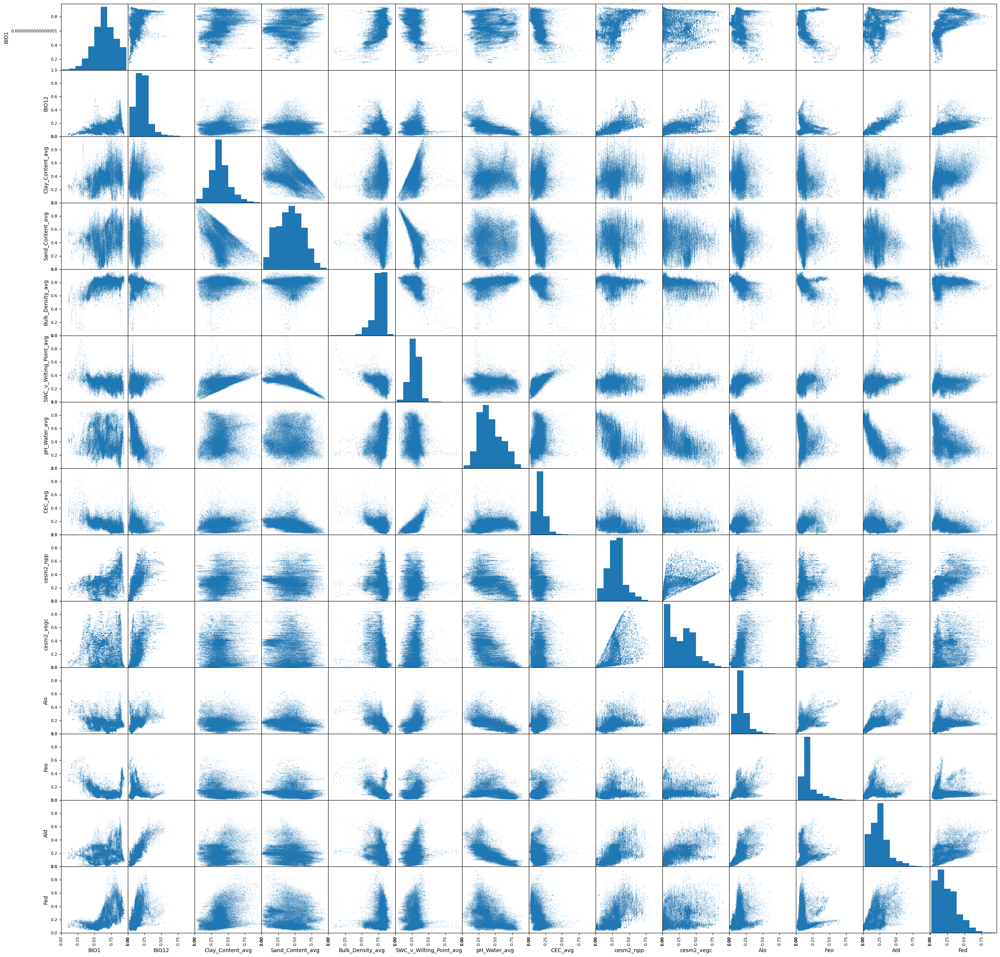

In [ ]:
df_env_info = env_info.loc[profile_collection[:, 0], var4nn]
# import seaborn as sns
import matplotlib.pyplot as plt

axes = pd.plotting.scatter_matrix(df_env_info, diagonal='hist', figsize=(32, 32), alpha=0.2, s=1, marker='o')

# Get the number of variables
num_vars = len(df_env_info.columns)

# Iterate over each subplot, applying limits only to off-diagonal plots
for i in range(num_vars):
    for j in range(num_vars):
        if i != j:  # only adjust non-diagonal axes
            axes[i, j].set_xlim(0, 1)
            axes[i, j].set_ylim(0, 1)

plt.show()


In [14]:
# #######################################################
# Load trained NN model
# #######################################################
def binns_loss(y_pred, y_true, pred_para):
    	# process modeling
	soc_simu = y_pred[:, 0, :]
	POM_simu = y_pred[:, 1, :]
	MAOM_simu = y_pred[:, 2, :]
	# observations
	soc_true = y_true[:, 0, :]
	POM_true = y_true[:, 1, :]
	MAOM_true = y_true[:, 2, :]
	# predicted parameters
	pred_para = pred_para

	# # if not all POM_true are nan, print POM_simu and POM_true
	# if torch.isnan(POM_true).all() == False:
	# 	print("POM simu", POM_simu)
	# 	print("POM true", POM_true)

	# print("Shape of model input", model_input.shape)
	# New input has shape: [32, 193]
	# flatten simulation
	soc_simu_vector = torch.reshape(soc_simu, [1, -1])
	POM_simu_vector = torch.reshape(POM_simu, [1, -1])
	MAOM_simu_vector = torch.reshape(MAOM_simu, [1, -1])
	soc_true_vector = torch.reshape(soc_true, [1, -1])
	POM_true_vector = torch.reshape(POM_true, [1, -1])
	MAOM_true_vector = torch.reshape(MAOM_true, [1, -1])
	# exclude nan
	valid_loc = torch.where(torch.isnan(soc_simu_vector+soc_true_vector) == False)
	soc_simu_vector = soc_simu_vector[valid_loc]
	soc_true_vector = soc_true_vector[valid_loc]

	valid_loc = torch.where(torch.isnan(POM_simu_vector+POM_true_vector) == False)
	POM_simu_vector = POM_simu_vector[valid_loc]
	POM_true_vector = POM_true_vector[valid_loc]

	valid_loc = torch.where(torch.isnan(MAOM_simu_vector+MAOM_true_vector) == False)
	MAOM_simu_vector = MAOM_simu_vector[valid_loc]
	MAOM_true_vector = MAOM_true_vector[valid_loc]

	# modeling inefficiency
	modeling_inefficiency_soc = torch.sum((soc_simu_vector - soc_true_vector)**2)/torch.sum((soc_true_vector - torch.mean(soc_true_vector))**2)
	modeling_inefficiency_POM = torch.sum((POM_simu_vector - POM_true_vector)**2)/torch.sum((POM_true_vector - torch.mean(POM_true_vector))**2)
	modeling_inefficiency_MAOM = torch.sum((MAOM_simu_vector - MAOM_true_vector)**2)/torch.sum((MAOM_true_vector - torch.mean(MAOM_true_vector))**2)


	# print("Modeling inefficiency for SOC, POM, and MAOM: ", modeling_inefficiency_soc, modeling_inefficiency_POM, modeling_inefficiency_MAOM)

	# # Define l2 loss
	# l2_loss_func = torch.nn.MSELoss(reduction='mean')

	# # Gradient of beta w.r.t. batch_x
	# grad_beta = torch.autograd.grad(outputs=beta, inputs=model_input, grad_outputs=torch.ones_like(beta), retain_graph=True)[0]
	# # only consider the gradient that is not zero
	# non_zero_idx = torch.nonzero(grad_beta)
	# grad_beta = grad_beta[non_zero_idx[:, 0], non_zero_idx[:, 1], non_zero_idx[:, 2], non_zero_idx[:, 3]]
	# # Use torch.autograd.grad for inputs for one profile
	# for i in range(beta.shape[0]):
	# 	grad_beta_temp = torch.autograd.grad(outputs=beta[i], inputs=model_input[i, :], grad_outputs=torch.ones_like(beta[i]), retain_graph=True)[0]
	# 	if i == 0:
	# 		grad_beta = grad_beta_temp
	# 	else:
	# 		grad_beta = torch.cat((grad_beta, grad_beta_temp), dim=0)
	# grad_norm = torch.norm(grad_beta, p=2)

	# print("Beta gradient norm", grad_norm)

	# modeling_inefficiency = torch.sum((soc_simu_vector - soc_true_vector)**2)/len(soc_true_vector) 
	# lambda_reg = 0.1

	# # Calculate the penalty if beta is too large
	# penalty_threshold = 0.8
	# transformed_threshold = -0.8  # Transformed threshold for negative values
	# penalty_weight = 20  # Adjust the weight as needed

	# # Inverting beta values so that high values become negative
	# inverted_beta = -beta

	# # Applying threshold to inverted beta
	# thresholded_beta = torch.nn.Threshold(transformed_threshold, 0)(inverted_beta)

	# # Inverting back to positive values and applying penalty
	# beta_penalty = penalty_weight * (-(thresholded_beta) - penalty_threshold)**2

	
	# # Sum the penalty across the batch
	# total_beta_penalty = beta_penalty.sum()

	# ## Variance term ##
	# # Calculate variance of predicted parameters
	# var_predicted_para = torch.var(pred_para[:, 20]) # calculate variance of the 21st parameter beta
	# # var_predicted_para = torch.mean(var_predicted_para)
	# # print("Variance of predicted parameters", var_predicted_para)

	# # Normalize or scale the variance term
	# scale_factor = 1e5
	# scaled_variance = scale_factor * var_predicted_para

	# # Weighting factor for variance term
	# variance_weight = 0

	# Regularization for predicted parameters using cosh
	# Encourage parameters to be around 0.5
	target_value = 0.5
	scale_factor = 10
	parameter_regularization_loss = torch.mean(torch.cosh(scale_factor*(pred_para - target_value)) - 1)

	# Weighting factor for regularization term
	regularization_weight = 100

	# Calculate the loss
	# * l2_loss_func(soc_simu_vector, soc_true_vector)
	# torch.nn.functional.smooth_l1_loss(soc_simu_vector, soc_true_vector, reduction='mean') * 
	l1_loss = torch.nn.functional.smooth_l1_loss(soc_simu_vector, soc_true_vector, reduction='mean')

	l1_loss_POM = torch.nn.functional.smooth_l1_loss(POM_simu_vector, POM_true_vector, reduction='mean')
	l1_loss_MAOM = torch.nn.functional.smooth_l1_loss(MAOM_simu_vector, MAOM_true_vector, reduction='mean')
	if torch.isnan(l1_loss_POM):
		l1_loss_POM = torch.tensor(0.0)
		modeling_inefficiency_POM = torch.tensor(0.0)
	if torch.isnan(l1_loss_MAOM):
		l1_loss_MAOM = torch.tensor(0.0)
		modeling_inefficiency_MAOM = torch.tensor(0.0)

	# else: 
	# 	print("L1 loss for POM and MAOM:", l1_loss_POM_MAOM.item())
	POM_MAOM_weight = 1
	


	loss = l1_loss + regularization_weight * parameter_regularization_loss + POM_MAOM_weight * (l1_loss_POM + l1_loss_MAOM) 
	# print(modeling_inefficiency)

	##########################
	# Regularization Penalty #
	##########################
	# lambda_reg = 0.001
	# L1_reg = sum(p.abs().sum() for p in model.parameters())
	# l2_reg = sum(p.pow(2.0).sum() for p in model.parameters())
	# loss = modeling_inefficiency # + lambda_reg * l2_reg

	return loss, modeling_inefficiency_soc, modeling_inefficiency_POM, modeling_inefficiency_MAOM, l1_loss, l1_loss_POM, l1_loss_MAOM
	
	# return modeling_inefficiency
# end binns loss


#---------------------------------------------------
# NN by PyTorch
#---------------------------------------------------
# define model
class nn_model(nn.Module):
	def __init__(self, var_idx_to_emb):
		super().__init__()

		# Dict from categorical variable index -> Embedding layer we use
		self.var_idx_to_emb = var_idx_to_emb

		# List of non-categorical variable indices
		self.non_categorical_indices = list(set(list(range(len(var4nn)))).difference(var_idx_to_emb.keys()))
		# # print("Categorical indices", var_idx_to_emb.keys())
		# # print("Noncategorical indices", self.non_categorical_indices)
		new_input_size = len(self.non_categorical_indices)
		# for idx, emb in self.var_idx_to_emb.items():
		# 	## for embedding layer ##
		# 	new_input_size += emb.embedding_dim
		# 	# ## for one-hot encoding ##
		# 	# new_input_size += emb

		###############################
		# Spatial Encoder from PE-GNN #
		###############################
  
		# self.spatial_encoder = GridCellSpatialRelationEncoder(
		# 	spa_embed_dim= 128, 
		# 	coord_dim=2, # Longitude and latitude
		# 	frequency_num=16, 
		# 	max_radius=360,
		# 	min_radius=1e-06,
		# 	freq_init="geometric",
		# 	ffn=True # Enable feedforward network for final spatial embeddings
		# )
		# # Adjust the input size
		# new_input_size -= 2  # Remove the longitude and latitude columns
		# new_input_size += 128  # Add the spatial embeddings



		# Neural network layers
		# first layer
		self.l1 = nn.Linear(new_input_size, 128)
		# torch.nn.init.xavier_uniform_(self.l1.weight)
		# nn.init.zeros_(self.l1.bias)
		
		
		# second layer
		self.l2 = nn.Linear(128, 128)
		# torch.nn.init.xavier_uniform_(self.l2.weight)
		# nn.init.zeros_(self.l2.bias)


		# third layer
		# self.l3 = nn.Linear(128, 128)
		# torch.nn.init.xavier_uniform_(self.l3.weight)
		# nn.init.zeros_(self.l3.bias)

		# fourth layer
		self.l4 = nn.Linear(128, 128)
		# torch.nn.init.xavier_uniform_(self.l4.weight)
		# nn.init.zeros_(self.l4.bias)


		# fifth layer
		self.l5 = nn.Linear(128, len(para_index))
		# torch.nn.init.xavier_uniform_(self.l5.weight)
		# nn.init.zeros_(self.l5.bias)


		# Dropout layers
		self.dropout = nn.Dropout(0)

		# leaky relu
		self.leaky_relu = nn.LeakyReLU(negative_slope=0.3)


		# sigmoid parameters
		self.temp_sigmoid = nn.Parameter(torch.tensor(0.0), requires_grad=True)

		# sigmoid
		self.sigmoid = nn.Sigmoid()

		# hardtanh
		# self.hardtanh = nn.Hardtanh(min_val=0, max_val=1, inplace=True)

		# softsign
		# self.softsign = nn.Softsign()

		# batch normalization
		self.bn1 = nn.BatchNorm1d(128)
		self.bn2 = nn.BatchNorm1d(128)
		# self.bn3 = nn.BatchNorm1d(128)
		self.bn4 = nn.BatchNorm1d(128)

		# Initialize weights
		gain_leaky_relu = nn.init.calculate_gain('leaky_relu', 0.3)
		gain_sigmoid = nn.init.calculate_gain('sigmoid')
		nn.init.xavier_uniform_(self.l1.weight, gain=gain_leaky_relu)
		nn.init.xavier_uniform_(self.l2.weight, gain=gain_leaky_relu)
		# nn.init.xavier_uniform_(self.l3.weight, gain=gain_leaky_relu)
		nn.init.xavier_uniform_(self.l4.weight, gain=gain_leaky_relu)
		nn.init.xavier_uniform_(self.l5.weight, gain=gain_sigmoid)

		# Initialize biases
		nn.init.zeros_(self.l1.bias)
		nn.init.zeros_(self.l2.bias)
		# nn.init.zeros_(self.l3.bias)
		nn.init.zeros_(self.l4.bias)
		nn.init.zeros_(self.l5.bias)



		# # Transform from 256 to 512
		# self.transform_h1_to_h2 = nn.Linear(256, 512)
		# torch.nn.init.xavier_uniform_(self.transform_h1_to_h2.weight)
		# nn.init.zeros_(self.transform_h1_to_h2.bias)

		# # Transform from 512 to 256
		# self.transform_h3_to_h4 = nn.Linear(512, 256)
		# torch.nn.init.xavier_uniform_(self.transform_h3_to_h4.weight)
		# nn.init.zeros_(self.transform_h3_to_h4.bias)

	def forward(self, input_var, wosis_depth, whether_predict):
		predictor = input_var[:, :, 0, 0]
		forcing = input_var[:, :, :, :]
		obs_depth = wosis_depth

		new_input = predictor[:, self.non_categorical_indices]
		# hidden layers
		h1 = self.l1(new_input)
		h1 = self.bn1(h1)
		h1 = self.leaky_relu(h1)
		h1 = self.dropout(h1)
		# transformed_h1 = self.transform_h1_to_h2(h1)
		h2 = self.l2(h1)
		h2 = self.bn2(h2)
		h2 = self.leaky_relu(h2) # + h1 # residual connection
		h2 = self.dropout(h2)
		# # transformed_h2 = self.transform_h2_to_h3(h2)
		# h3 = self.l3(h2)
		# h3 = self.bn3(h3)
		# h3 = self.leaky_relu(h3) # residual connection
		# h3 = self.dropout(h3)
		# transformed_h3 = self.transform_h3_to_h4(h3)
		h4 = self.l4(h2) ### remember to change back to h2 if only use 4 layers ###
		h4 = self.bn4(h4)
		h4 = self.leaky_relu(h4) # + h3 # residual connection
		h4 = self.dropout(h4)
		# Clamp temp_sigmoid to be between 10 and 200
		# clamped_temp_sigmoid = torch.clamp(self.temp_sigmoid, 10, 200)
		clamped_temp_sigmoid = 10 + 99 * self.sigmoid(self.temp_sigmoid) # try with a smaller range
		# h5 = torch.sigmoid(self.l5(h4) / clamped_temp_sigmoid)
		h5 = self.sigmoid(self.l5(h4)/clamped_temp_sigmoid)

		##############################
		# Without Parallel Computing #
		##############################
		if whether_predict == 1:
			simu_soc = fun_model_prediction(h5, forcing)
		else:
			simu_soc = fun_model_simu(h5, forcing, obs_depth)

		
		return simu_soc, h5
	
class nn_model_shap(nn.Module):
	def __init__(self, var_idx_to_emb):
		super().__init__()

		# Dict from categorical variable index -> Embedding layer we use
		self.var_idx_to_emb = var_idx_to_emb

		# List of non-categorical variable indices
		self.non_categorical_indices = list(set(list(range(len(var4nn)))).difference(var_idx_to_emb.keys()))
		# print("Categorical indices", var_idx_to_emb.keys())
		# print("Noncategorical indices", self.non_categorical_indices)
		new_input_size = len(self.non_categorical_indices)

		# Neural network layers
		# first layer
		self.l1 = nn.Linear(new_input_size, 128)
		# torch.nn.init.xavier_uniform_(self.l1.weight)
		# nn.init.zeros_(self.l1.bias)
		
		
		# second layer
		self.l2 = nn.Linear(128, 128)
		# torch.nn.init.xavier_uniform_(self.l2.weight)
		# nn.init.zeros_(self.l2.bias)


		# third layer
		# self.l3 = nn.Linear(128, 128)
		# torch.nn.init.xavier_uniform_(self.l3.weight)
		# nn.init.zeros_(self.l3.bias)

		# fourth layer
		self.l4 = nn.Linear(128, 128)
		# torch.nn.init.xavier_uniform_(self.l4.weight)
		# nn.init.zeros_(self.l4.bias)


		# fifth layer
		self.l5 = nn.Linear(128, len(para_index))
		# torch.nn.init.xavier_uniform_(self.l5.weight)
		# nn.init.zeros_(self.l5.bias)


		# Dropout layers
		self.dropout = nn.Dropout(0)

		# leaky relu
		self.leaky_relu = nn.LeakyReLU(negative_slope=0.3)


		# sigmoid parameters
		self.temp_sigmoid = nn.Parameter(torch.tensor(0.0), requires_grad=True)

		# sigmoid
		self.sigmoid = nn.Sigmoid()


		# batch normalization
		self.bn1 = nn.BatchNorm1d(128)
		self.bn2 = nn.BatchNorm1d(128)
		# self.bn3 = nn.BatchNorm1d(128)
		self.bn4 = nn.BatchNorm1d(128)

		# Initialize weights
		gain_leaky_relu = nn.init.calculate_gain('leaky_relu', 0.3)
		gain_sigmoid = nn.init.calculate_gain('sigmoid')
		nn.init.xavier_uniform_(self.l1.weight, gain=gain_leaky_relu)
		nn.init.xavier_uniform_(self.l2.weight, gain=gain_leaky_relu)
		# nn.init.xavier_uniform_(self.l3.weight, gain=gain_leaky_relu)
		nn.init.xavier_uniform_(self.l4.weight, gain=gain_leaky_relu)
		nn.init.xavier_uniform_(self.l5.weight, gain=gain_sigmoid)

		# Initialize biases
		nn.init.zeros_(self.l1.bias)
		nn.init.zeros_(self.l2.bias)
		# nn.init.zeros_(self.l3.bias)
		nn.init.zeros_(self.l4.bias)
		nn.init.zeros_(self.l5.bias)


	def forward(self, input_var):
		predictor = torch.tensor(input_var, dtype=torch.float32).to(device)

		new_input = predictor[:, self.non_categorical_indices]  # Non-categorical variables
		# hidden layers
		h1 = self.l1(new_input)
		h1 = self.bn1(h1)
		h1 = self.leaky_relu(h1)
		h1 = self.dropout(h1)
		# transformed_h1 = self.transform_h1_to_h2(h1)
		h2 = self.l2(h1)
		h2 = self.bn2(h2)
		h2 = self.leaky_relu(h2) # + h1 # residual connection
		h2 = self.dropout(h2)
		# # transformed_h2 = self.transform_h2_to_h3(h2)
		# h3 = self.l3(h2)
		# h3 = self.bn3(h3)
		# h3 = self.leaky_relu(h3) # residual connection
		# h3 = self.dropout(h3)
		# transformed_h3 = self.transform_h3_to_h4(h3)
		h4 = self.l4(h2) ### remember to change back to h2 if only use 4 layers ###
		h4 = self.bn4(h4)
		h4 = self.leaky_relu(h4) # + h3 # residual connection
		h4 = self.dropout(h4)
		# Clamp temp_sigmoid to be between 10 and 200
		# clamped_temp_sigmoid = torch.clamp(self.temp_sigmoid, 10, 200)
		clamped_temp_sigmoid = 10 + 99 * self.sigmoid(self.temp_sigmoid) # try with a smaller range
		# h5 = torch.sigmoid(self.l5(h4) / clamped_temp_sigmoid)
		h5 = self.sigmoid(self.l5(h4)/clamped_temp_sigmoid)
	
		return h5.cpu().detach().numpy()

# Create embeddings for categorical variables (each int maps to a different category)
var_idx_to_emb = dict()  # Column index to Embedding layer to use
embed_dim = 50  # Embedding dimension
for group in categorical_vars:
	n_categories = int(np.nanmax(env_info[group]) + 1)
	emb = nn.Embedding(num_embeddings=n_categories, embedding_dim=embed_dim).to(device)
	for var in group:
		idx = var4nn.index(var)
		var_idx_to_emb[idx] = emb

# Load model from checkpoint
model = nn_model(var_idx_to_emb)
state_dict = checkpoint['model_state_dict']
torch.nn.modules.utils.consume_prefix_in_state_dict_if_present(state_dict, prefix="module.")  # Remove module. from state_dict if DDP
model.load_state_dict(state_dict)
# (If resuming training, we would also need to load the optimizer state dict, but we are not doing that here)
model_shap = nn_model_shap(var_idx_to_emb)
state_dict = checkpoint['model_state_dict']
torch.nn.modules.utils.consume_prefix_in_state_dict_if_present(state_dict, prefix="module.")  # Remove module. from state_dict if DDP 
model_shap.load_state_dict(state_dict)
model_shap.eval()
# print("MODEL", model)

nn_model_shap(
  (l1): Linear(in_features=14, out_features=128, bias=True)
  (l2): Linear(in_features=128, out_features=128, bias=True)
  (l4): Linear(in_features=128, out_features=128, bias=True)
  (l5): Linear(in_features=128, out_features=23, bias=True)
  (dropout): Dropout(p=0, inplace=False)
  (leaky_relu): LeakyReLU(negative_slope=0.3)
  (sigmoid): Sigmoid()
  (bn1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn2): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn4): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
)

In [10]:
# Split the data into training, validation, and test sets based on indices from checkpoint
train_loc = checkpoint['train_indices']
valid_loc = checkpoint['val_indices']
test_loc = checkpoint['test_indices']

# Split the data
train_y = torch.tensor(current_data_y[train_loc, :, :], dtype=torch.float32)
val_y = torch.tensor(current_data_y[val_loc, :, :], dtype=torch.float32)
test_y = torch.tensor(current_data_y[test_loc, :, :], dtype=torch.float32)

train_z = torch.tensor(current_data_z[train_loc, :], dtype=torch.float32)
val_z = torch.tensor(current_data_z[val_loc, :], dtype=torch.float32)
test_z = torch.tensor(current_data_z[test_loc, :], dtype=torch.float32)

train_x = torch.tensor(current_data_x[train_loc, :, :, :], dtype=torch.float32)
val_x = torch.tensor(current_data_x[val_loc, :, :, :], dtype=torch.float32)
test_x = torch.tensor(current_data_x[test_loc, :, :, :], dtype=torch.float32)

train_profile_id = torch.tensor(current_data_profile_id[train_loc], dtype=torch.long)
val_profile_id = torch.tensor(current_data_profile_id[val_loc], dtype=torch.long)
test_profile_id = torch.tensor(current_data_profile_id[test_loc], dtype=torch.long)

In [15]:
# Test the model with the test data
fun_loss = binns_loss
model.eval()
with torch.no_grad():
    test_y_hat, test_pred_para = model(test_x, test_z, 0)
    test_loss, test_NSE_soc, test_NSE_POM, test_NSE_MAOM, test_l1_loss, test_l1_POM_loss, test_l1_MAOM_loss = fun_loss(test_y_hat, test_y, test_pred_para)
    print(f'Test loss: {test_loss.item():.4f}, Test NSE_soc: {test_NSE_soc.item():.4f}, Test NSE_POM: {test_NSE_POM.item():.4f}, Test NSE_MAOM: {test_NSE_MAOM.item():.4f}, Test L1 loss: {test_l1_loss.item():.4f}, Test L1 POM loss: {test_l1_POM_loss.item():.4f}, Test L1 MAOM loss: {test_l1_MAOM_loss.item():.4f}')


Test loss: 19674.6816, Test NSE_soc: 0.5235, Test NSE_POM: 0.5242, Test NSE_MAOM: 0.4452, Test L1 loss: 6116.8774, Test L1 POM loss: 5832.9985, Test L1 MAOM loss: 6335.2163


In [19]:
# Save test results into test folder
best_simu_soc = torch.tensor(np.ones((combined_profile_num, 200))*np.nan, dtype = torch.float32, device=device)
best_simu_POM = torch.tensor(np.ones((combined_profile_num, 200))*np.nan, dtype = torch.float32, device=device)
best_simu_MAOM = torch.tensor(np.ones((combined_profile_num, 200))*np.nan, dtype = torch.float32, device=device)
best_pred_para = torch.tensor(np.ones((combined_profile_num, len(para_names)))*np.nan, dtype = torch.float32, device=device)
upper_depth_all = np.ones((combined_profile_num, 200))*np.nan
lower_depth_all = np.ones((combined_profile_num, 200))*np.nan

upper_depth_all[current_data_profile_id, :] = obs_upper_depth_matrix
lower_depth_all[current_data_profile_id, :] = obs_lower_depth_matrix

best_simu_soc[test_profile_id, :] = test_y_hat[:, 0, :]
best_simu_POM[test_profile_id, :] = test_y_hat[:, 1, :]
best_simu_MAOM[test_profile_id, :] = test_y_hat[:, 2, :]
best_pred_para[test_profile_id, :] = test_pred_para

# save data
if not os.path.exists(data_dir_input + '/Test'):
	os.makedirs(data_dir_input + '/Test')
np.savetxt(data_dir_input + '/Test/nn_test_best_simu_soc_' + time_stamp + '.csv', best_simu_soc.detach().cpu().numpy(), delimiter = ',')
np.savetxt(data_dir_input + '/Test/nn_test_best_simu_POM_' + time_stamp + '.csv', best_simu_POM.detach().cpu().numpy(), delimiter = ',')
np.savetxt(data_dir_input + '/Test/nn_test_best_simu_MAOM_' + time_stamp + '.csv', best_simu_MAOM.detach().cpu().numpy(), delimiter = ',')
np.savetxt(data_dir_input + '/Test/nn_test_best_pred_para_' + time_stamp + '.csv', best_pred_para.detach().cpu().numpy(), delimiter = ',')

In [34]:
########################################################
# SHAP analysis
########################################################
# Remove nan for env_info
env_info_no_nan = env_info.dropna(subset=var4nn)
# Get the background data for SHAP
background_data = shap.sample(env_info_no_nan[var4nn].values, 200)
explainer = shap.KernelExplainer(model_shap, background_data)
shap_values = explainer.shap_values(
    shap.sample(env_info_no_nan[var4nn].values, 2000)
)

Using 200 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|██████████| 2000/2000 [32:42<00:00,  1.02it/s]


Mean SHAP values for A:
Alo    0.000012
Feo   -0.000242
Ald   -0.000043
Fed    0.000057
dtype: float64


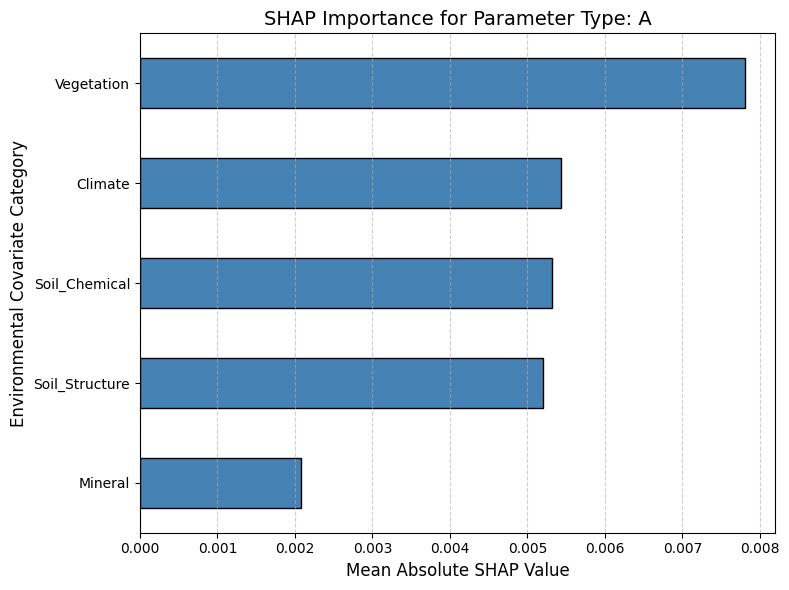

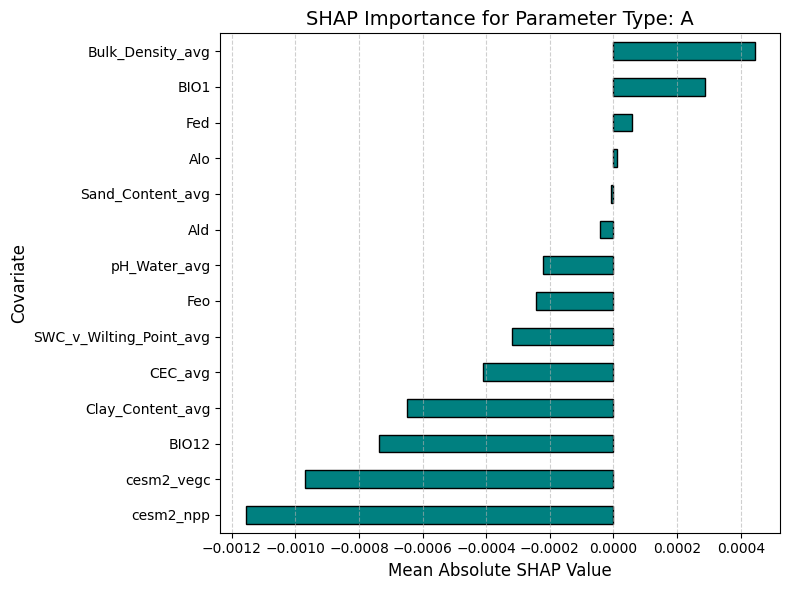

Mean SHAP values for K_soil:
Alo    0.000219
Feo   -0.000440
Ald    0.000122
Fed    0.000106
dtype: float64


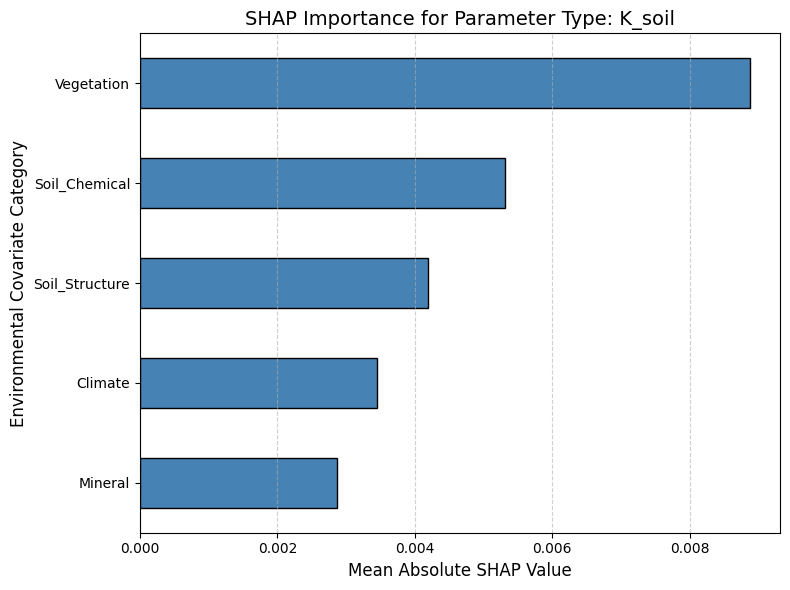

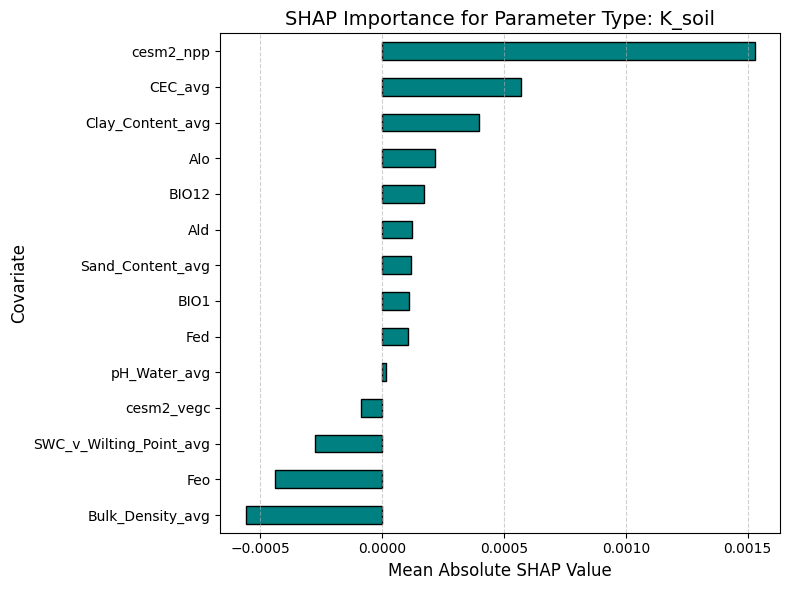

Mean SHAP values for K_litter:
Alo   -0.000020
Feo    0.000097
Ald    0.000056
Fed   -0.000027
dtype: float64


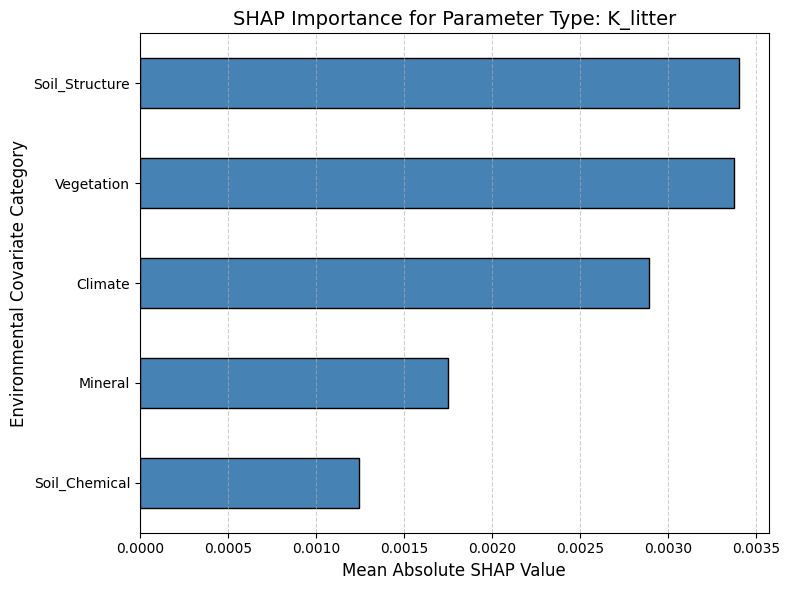

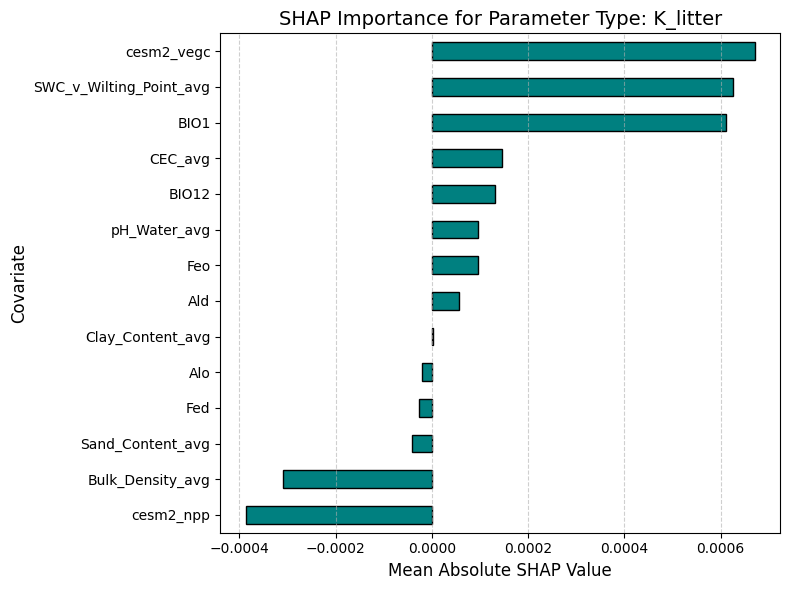

Mean SHAP values for Xi:
Alo   -0.001043
Feo   -0.000405
Ald   -0.000398
Fed    0.001256
dtype: float64


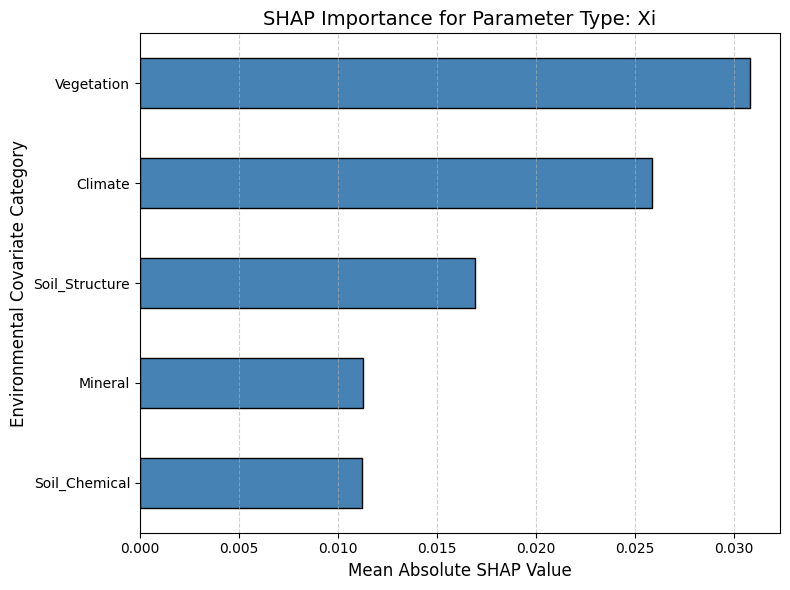

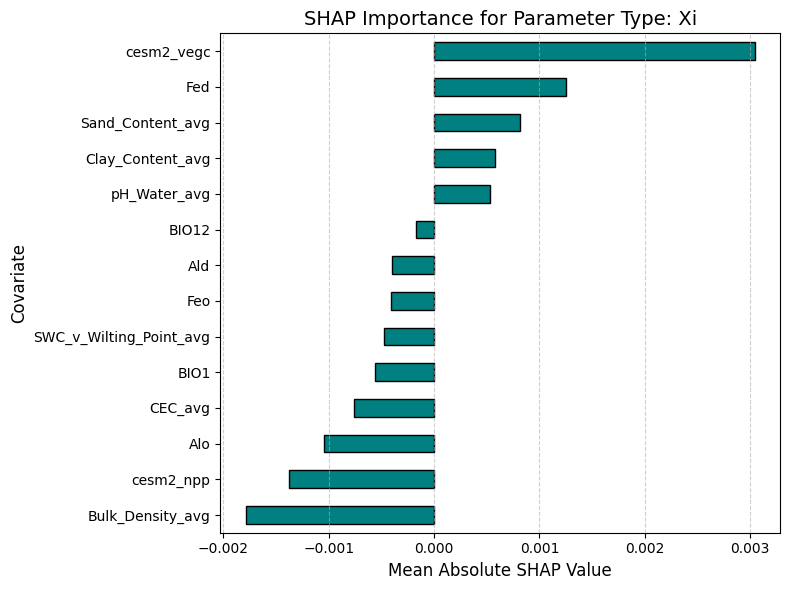

Mean SHAP values for I:
Alo   -0.001535
Feo   -0.000639
Ald   -0.000079
Fed    0.000703
dtype: float64


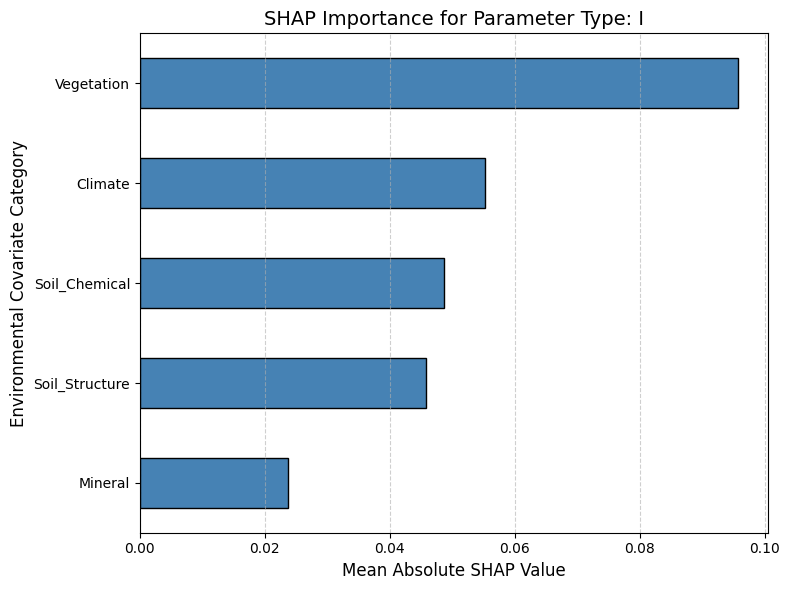

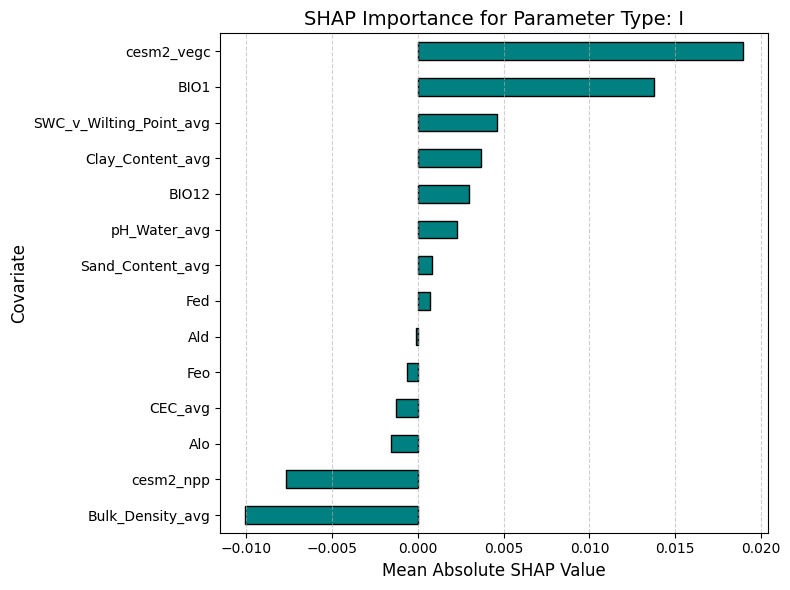

Mean SHAP values for V:
Alo   -0.001153
Feo    0.001058
Ald    0.000183
Fed   -0.000853
dtype: float64


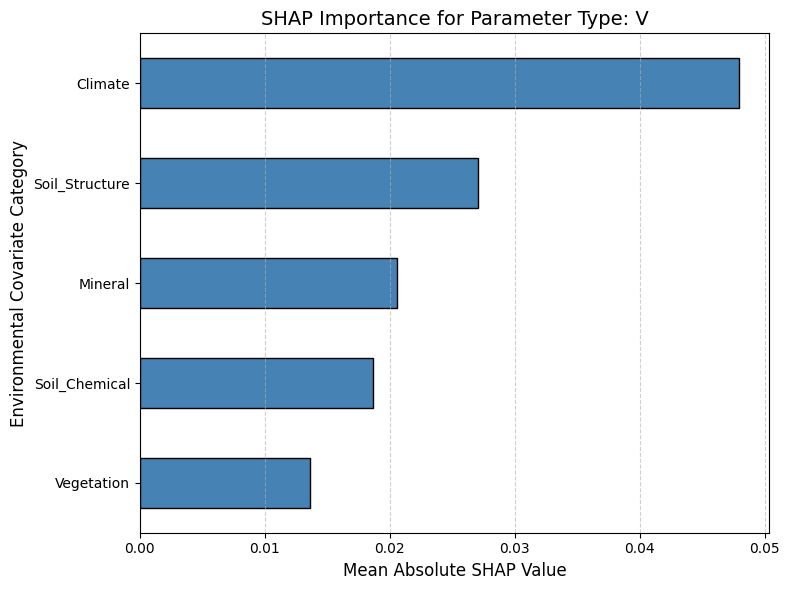

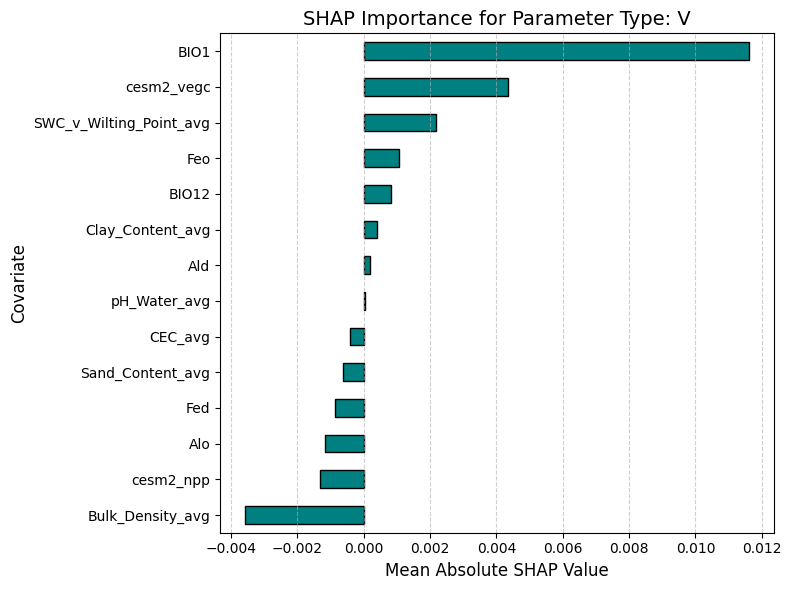

In [41]:
# SHAP values converted to DataFrame for easier handling
para_types = {1: 'A', 2: 'K_soil', 3: 'K_litter', 4: 'Xi', 5: 'I', 6: 'V'}

# Group SHAP values into DataFrames by parameter types
shap_dfs = {}
for type_idx, type_name in para_types.items():
    para_indices = [i for i, idx in enumerate(para_names_index) if idx == type_idx]
    shap_subset = shap_values[:, :, para_indices].mean(axis=2)  # average over selected parameters
    shap_dfs[type_name] = pd.DataFrame(shap_subset, columns=var4nn)

category_dict = {
    'Soil_Structure': soil_var,
    'Soil_Chemical': soil_var_chemical,
    'Climate': climate_var,
    'Vegetation': vegetation_var,
    'Mineral': mineral_var
}

# Create a path to save the Output
category_dict_path = data_dir_output + 'Matrix_by_category/'
if not os.path.exists(category_dict_path):
	os.makedirs(category_dict_path)
all_dict_path = data_dir_output + 'Matrix_by_all/'
if not os.path.exists(all_dict_path):
	os.makedirs(all_dict_path)
# For each key in shap_dfs, group the columns by category within category_dict
# Plot the SHAP values for each category in a bar plot
for key, value in shap_dfs.items():
	shap_df = value
	# Group SHAP values by category within category_dict and calculate the mean
	shap_grouped = df()
	for category, variables in category_dict.items():
		valid_vars = [var for var in variables if var in shap_df.columns]
		shap_grouped[category] = shap_df[valid_vars].abs().mean(axis=1)
	# Average across samples to get a single mean SHAP value per category
	mean_shap = shap_grouped.mean().sort_values()

	# Print the mean SHAP values for each category
	print(f"Mean SHAP values for {key}:")
	print(shap_df[['Alo', 'Feo', 'Ald', 'Fed']].mean())

	# Plotting bar plot (all positive values)
	fig1 = plt.figure(figsize=(8, 6))
	mean_shap.plot.barh(color='steelblue', edgecolor='black')
	plt.xlabel('Mean Absolute SHAP Value', fontsize=12)
	plt.ylabel('Environmental Covariate Category', fontsize=12)
	plt.title(f'SHAP Importance for Parameter Type: {key}', fontsize=14)
	plt.grid(axis='x', linestyle='--', alpha=0.6)
	plt.tight_layout()
	plt.show()
	fig1.savefig(category_dict_path + f'SHAP_Importance_by_Category_{key}.png', dpi=300, bbox_inches='tight')


	# Plotting bar plot for the top 10 most important categories in shap_df (all positive values)
	mean_abs_shap = shap_df.mean().sort_values(ascending=False)
	all_shap = mean_abs_shap.sort_values()
	fig2 = plt.figure(figsize=(8, 6))
	all_shap.plot.barh(color='teal', edgecolor='black')
	plt.xlabel('Mean Absolute SHAP Value', fontsize=12)
	plt.ylabel('Covariate', fontsize=12)
	plt.title(f'SHAP Importance for Parameter Type: {key}', fontsize=14)
	plt.grid(axis='x', linestyle='--', alpha=0.6)
	plt.tight_layout()
	plt.show()
	fig2.savefig(all_dict_path + f'SHAP_Importance_by_all_{key}.png', dpi=300, bbox_inches='tight')



Shap values for parameter: diffus
Alo   -0.001790
Feo    0.000814
Ald    0.001919
Fed   -0.003576
dtype: float64
Shap values for parameter: cryo
Alo   -0.000516
Feo    0.001301
Ald   -0.001552
Fed    0.001871
dtype: float64
Shap values for parameter: q10
Alo   -0.002011
Feo   -0.000603
Ald   -0.001354
Fed    0.002664
dtype: float64
Shap values for parameter: efolding
Alo   -0.000751
Feo   -0.000196
Ald   -0.000333
Fed    0.000709
dtype: float64
Shap values for parameter: taucwd
Alo   -1.371550e-07
Feo    2.375830e-07
Ald   -1.392334e-07
Fed    4.682489e-08
dtype: float64
Shap values for parameter: taul1
Alo    0.000018
Feo   -0.000035
Ald    0.000003
Fed    0.000059
dtype: float64
Shap values for parameter: taul2
Alo   -0.000079
Feo    0.000325
Ald    0.000166
Fed   -0.000139
dtype: float64
Shap values for parameter: tau4doc
Alo    0.000689
Feo   -0.000541
Ald    0.000114
Fed    0.000133
dtype: float64
Shap values for parameter: tau4mic
Alo    0.000565
Feo   -0.000659
Ald    0.000029
F

C:\Users\hx293\AppData\Local\Temp\ipykernel_45692\190535154.py:39: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig1 = plt.figure(figsize=(8, 6))


Shap values for parameter: fl1_DOC
Alo   -0.000452
Feo   -0.000448
Ald   -0.000001
Fed   -0.000632
dtype: float64
Shap values for parameter: fl1_MIC
Alo   -0.000586
Feo   -0.000031
Ald    0.000035
Fed   -0.000509
dtype: float64
Shap values for parameter: fl2_MIC
Alo    0.000036
Feo    0.000014
Ald    0.000291
Fed   -0.000481
dtype: float64
Shap values for parameter: fl2_MAOM
Alo    0.000078
Feo   -0.000557
Ald   -0.000795
Fed    0.000608
dtype: float64
Shap values for parameter: fMIC_DOC
Alo   -0.000179
Feo   -0.000071
Ald    0.000114
Fed   -0.000034
dtype: float64
Shap values for parameter: fMIC_POC
Alo   -0.000244
Feo    0.000143
Ald    0.000515
Fed   -0.000459
dtype: float64
Shap values for parameter: fPOC_DOC
Alo   -0.000197
Feo    0.000142
Ald    0.000266
Fed   -0.000133
dtype: float64
Shap values for parameter: CUEl1
Alo    0.000168
Feo   -0.000254
Ald   -0.000518
Fed    0.001198
dtype: float64
Shap values for parameter: CUEl2
Alo    0.001107
Feo   -0.001035
Ald   -0.000275
Fed  

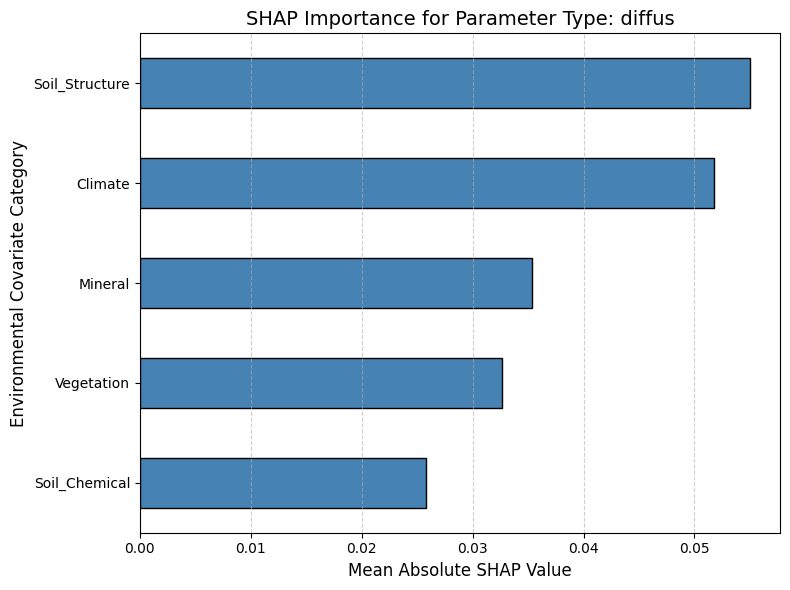

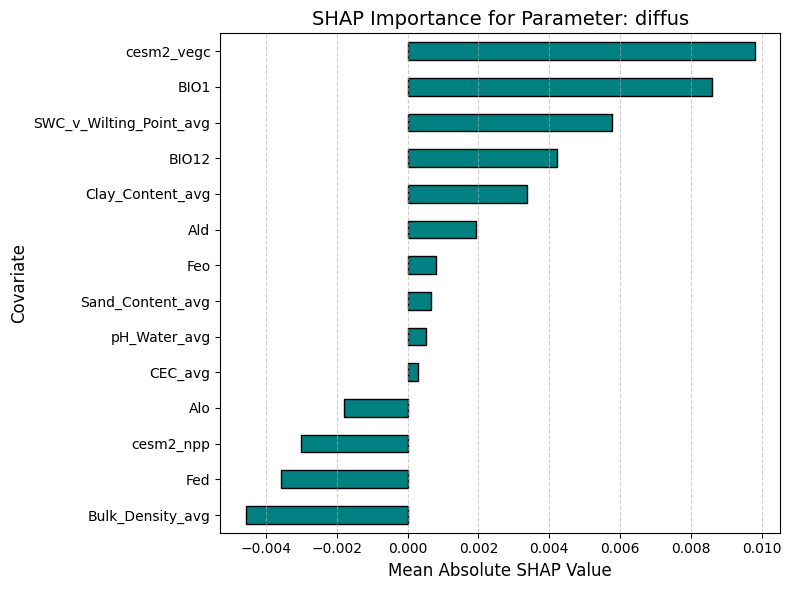

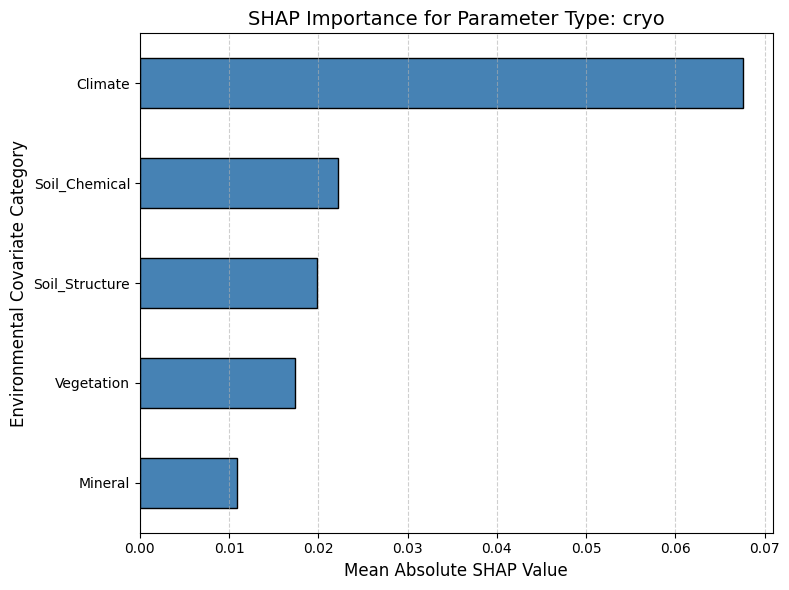

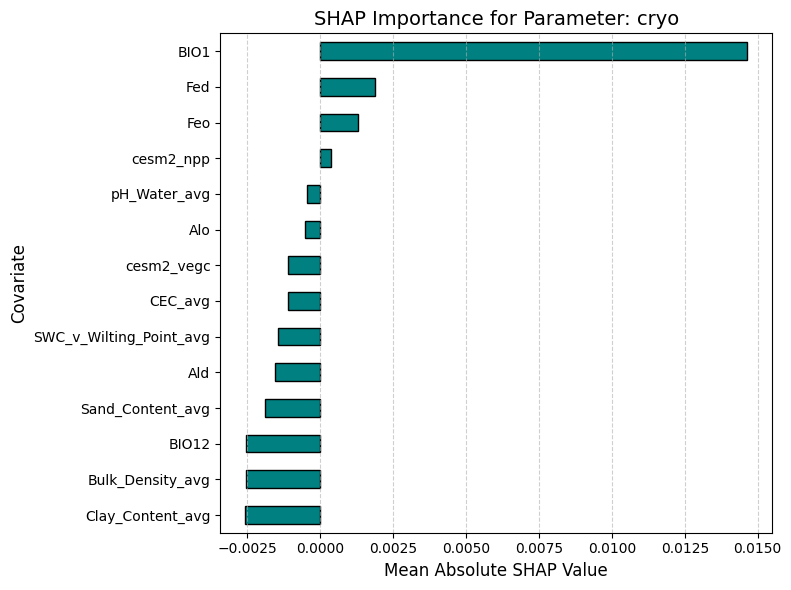

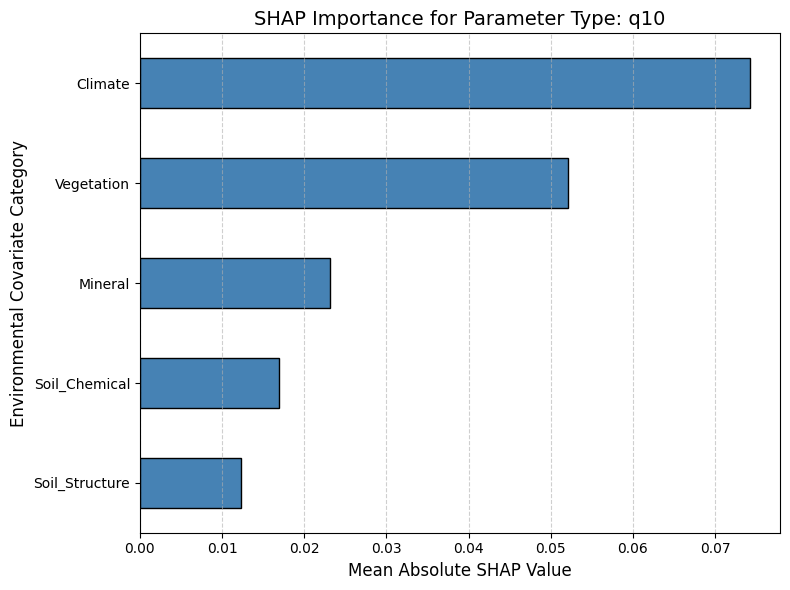

...

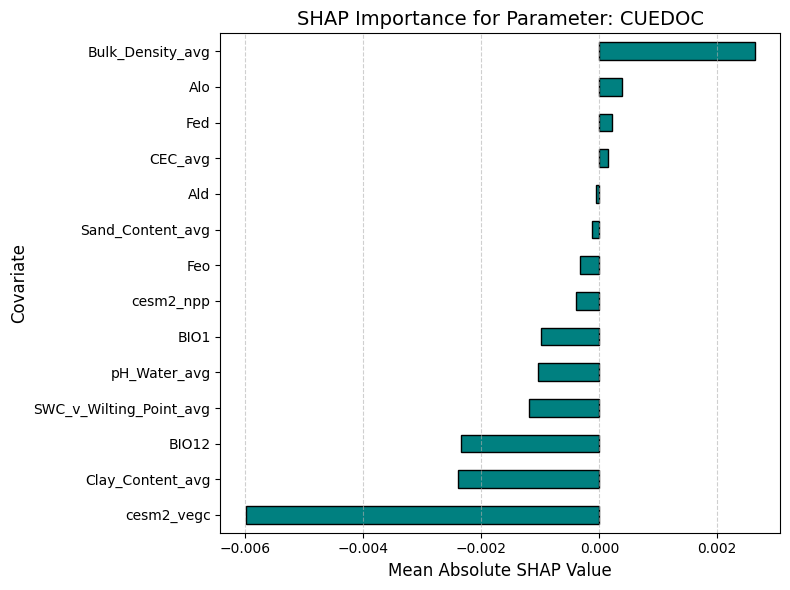

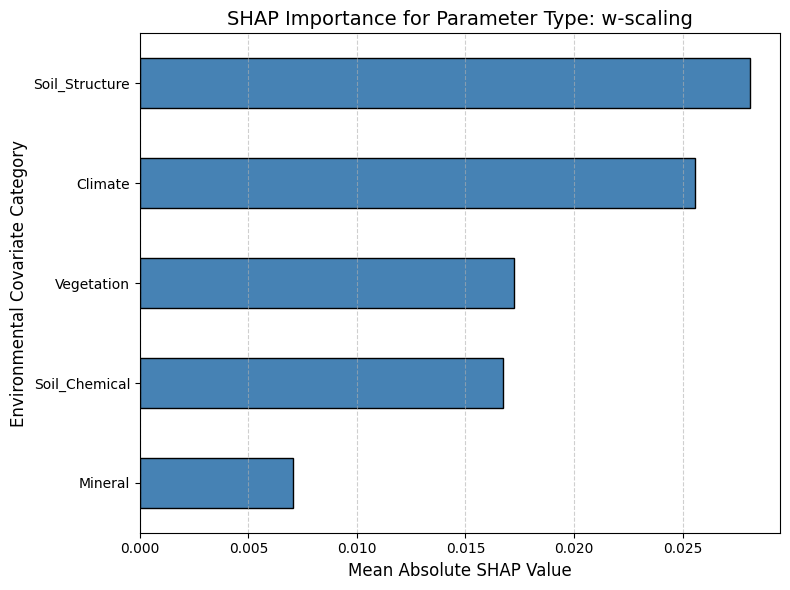

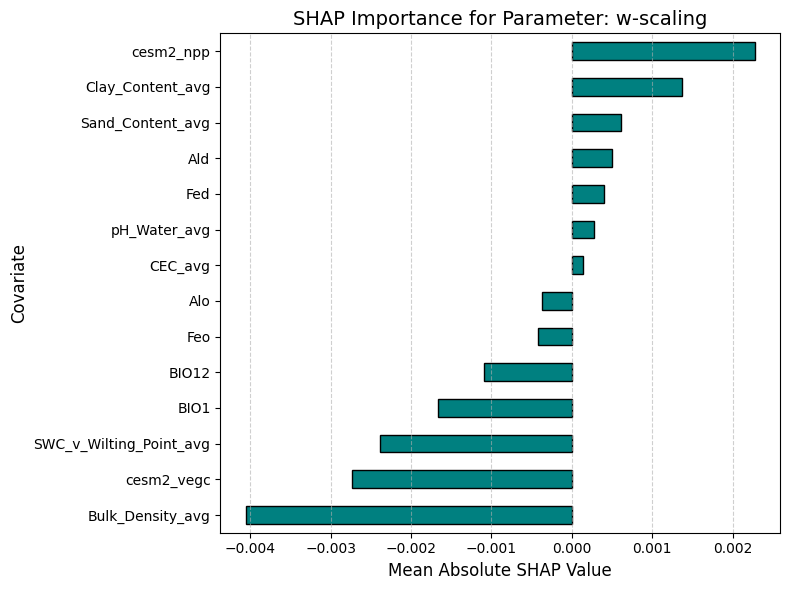

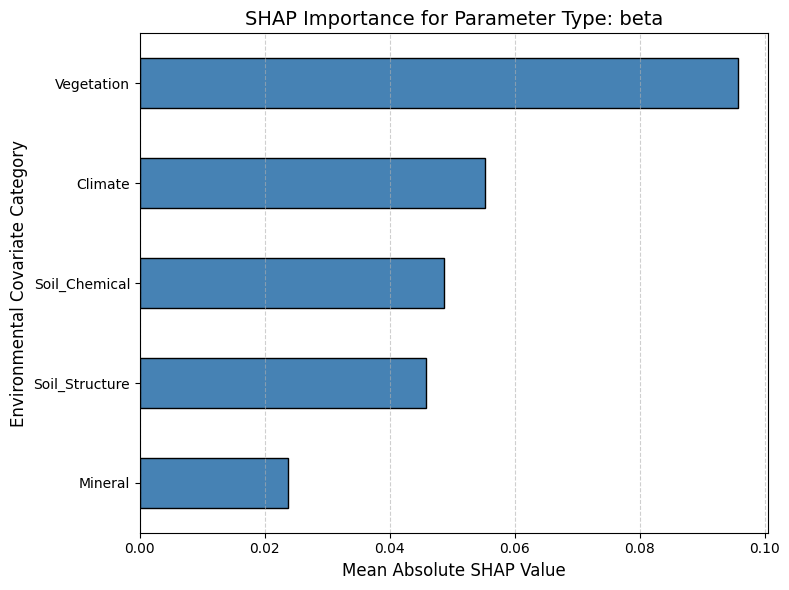

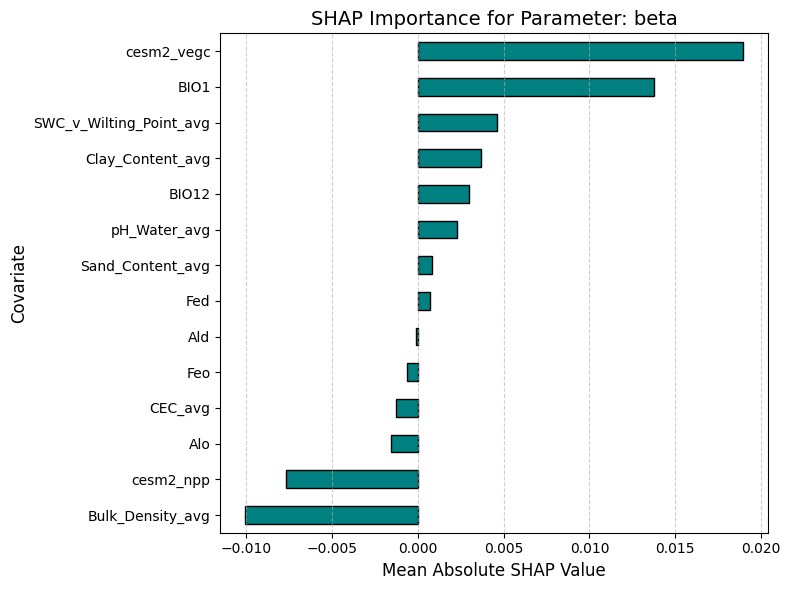

In [42]:
# Group SHAP values into DataFrames by parameter types
shap_paras = {}
for para_name in para_names:
	para_idx = para_names.index(para_name)
	shap_paras[para_name] = pd.DataFrame(shap_values[:, :, para_idx], columns=var4nn)

category_dict = {
    'Soil_Structure': soil_var,
    'Soil_Chemical': soil_var_chemical,
    'Climate': climate_var,
    'Vegetation': vegetation_var,
    'Mineral': mineral_var
}

# Create a path to save the Output
category_dict_path = data_dir_output + 'Para_by_category/'
if not os.path.exists(category_dict_path):
	os.makedirs(category_dict_path)
all_dict_path = data_dir_output + 'Para_by_all/'
if not os.path.exists(all_dict_path):
	os.makedirs(all_dict_path)
# For each key in shap_dfs, group the columns by category within category_dict
# Plot the SHAP values for each category in a bar plot
for key, value in shap_paras.items():
	shap_df = value
	# Group SHAP values by category within category_dict and calculate the mean
	shap_grouped = df()
	for category, variables in category_dict.items():
		valid_vars = [var for var in variables if var in shap_df.columns]
		shap_grouped[category] = shap_df[valid_vars].abs().mean(axis=1)
	# Average across samples to get a single mean SHAP value per category
	mean_shap = shap_grouped.mean().sort_values()

	# Print the mean SHAP values for each category
	print('Shap values for parameter:', key)
	print(shap_df[['Alo', 'Feo', 'Ald', 'Fed']].mean())

	# Plotting bar plot (all positive values)
	fig1 = plt.figure(figsize=(8, 6))
	mean_shap.plot.barh(color='steelblue', edgecolor='black')
	plt.xlabel('Mean Absolute SHAP Value', fontsize=12)
	plt.ylabel('Environmental Covariate Category', fontsize=12)
	plt.title(f'SHAP Importance for Parameter Type: {key}', fontsize=14)
	plt.grid(axis='x', linestyle='--', alpha=0.6)
	plt.tight_layout()
	fig1.savefig(category_dict_path + f'SHAP_Importance_by_Category_{key}.png', dpi=300, bbox_inches='tight')

	# Plotting bar plot for the top 10 most important categories in shap_df (all positive values)
	mean_abs_shap = shap_df.mean().sort_values(ascending=False)
	all_shap = mean_abs_shap.sort_values()
	fig2 = plt.figure(figsize=(8, 6))
	all_shap.plot.barh(color='teal', edgecolor='black')
	plt.xlabel('Mean Absolute SHAP Value', fontsize=12)
	plt.ylabel('Covariate', fontsize=12)
	plt.title(f'SHAP Importance for Parameter: {key}', fontsize=14)
	plt.grid(axis='x', linestyle='--', alpha=0.6)
	plt.tight_layout()
	fig2.savefig(all_dict_path + f'SHAP_Importance_by_Category_{key}.png', dpi=300, bbox_inches='tight')
